# Italian Airport Network - 25 Years of Flights  
  
  <br/><br/>

![](visuals/00_cover.gif?raw=true)

## 01. Exploratory Data Analysis  
  
  <br/><br/>

This is a personal project that aims to analyse the performance of Italian airports in terms of key operational metrics: aircraft movements, passenger traffic, and freight throughput.  
By examining historical data (starting from the year 2000) and identifying trends, my goal is to gain insights into the efficiency, capacity, and potential areas for improvement of different airports.  

  
  <br/><br/>
  

## Libraries Import

In [1]:
import pandas as pd
import numpy as np
import warnings
import glob
import os

import sys
import geopandas as gpd
from tqdm import tqdm

In [2]:
import folium
import matplotlib.pyplot as plt
import matplotlib.ticker as tkr
import seaborn as sns

plt.style.use('fivethirtyeight')
sns.set(font_scale=0.8)

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [3]:
# run to avoid warnings
warnings.filterwarnings('ignore')

## Data Loading

In [4]:
# load the data from the final CSV, using the previous Date column as index 
df = pd.read_csv('datasets/final/df_fin.csv', index_col='Date', parse_dates=True)

In [5]:
df

,Airport,Code,Geographic Area,Dimension,Latitude,Longitude,Month,Year,MOV - Domestic,MOV - International,...,PAX - Domestic,PAX - International,PAX - EU,PAX - Transit,PAX - General Avio,PAX - Total,FRE - Goods Avio,FRE - Goods Ground,FRE - Mail,FRE - Total
Date,,,,,,,,,,,,,,,,,,,,,
2000-01-01,Alghero,AHO,Islands,Small,40.6306,8.2954,1,2000,515.0,25.0,...,30634.0,799.0,0.0,0.0,0.0,31433.0,59.000,0.0000,74.000,133.0000
2000-01-01,Ancona,AOI,Central-East,Small-Medium,43.6068,13.3551,1,2000,476.0,346.0,...,18183.0,12098.0,7056.0,61.0,656.0,30998.0,232.000,2.0000,68.000,302.0000
2000-01-01,Bari,BRI,South,Medium-Large,41.1343,16.7635,1,2000,1437.0,77.0,...,82936.0,1217.0,0.0,68.0,110.0,84331.0,168.000,0.0000,193.000,361.0000
2000-01-01,Bergamo,BGY,North-West,Large,45.6657,9.6989,1,2000,770.0,2302.0,...,38403.0,48697.0,25666.0,653.0,189.0,87942.0,7139.000,80.0000,1.000,7220.0000
2000-01-01,Bologna,BLQ,North-East,Medium-Large,44.5295,11.2930,1,2000,1379.0,3108.0,...,67923.0,150338.0,120214.0,5424.0,307.0,223992.0,945.000,422.0000,255.000,1622.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-12-01,Trapani,TPS,Islands,Medium,37.9017,12.4959,12,2024,399.0,25.0,...,41827.0,3018.0,3018.0,104.0,83.0,45032.0,0.000,0.0000,0.000,0.0000
2024-12-01,Treviso,TSF,North-East,Medium,45.6547,12.2046,12,2024,32.0,1356.0,...,2129.0,224120.0,181018.0,178.0,190.0,226617.0,0.000,0.0000,0.000,0.0000
2024-12-01,Trieste,TRS,North-East,Medium,45.8213,13.4854,12,2024,527.0,372.0,...,57375.0,45507.0,37642.0,179.0,223.0,103284.0,0.834,0.5220,0.020,1.3760


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 11202 entries, 2000-01-01 to 2024-12-01
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Airport              11202 non-null  object 
 1   Code                 11202 non-null  object 
 2   Geographic Area      11202 non-null  object 
 3   Dimension            11202 non-null  object 
 4   Latitude             11202 non-null  float64
 5   Longitude            11202 non-null  float64
 6   Month                11202 non-null  int64  
 7   Year                 11202 non-null  int64  
 8   MOV - Domestic       11153 non-null  float64
 9   MOV - International  11153 non-null  float64
 10  MOV - EU             11117 non-null  float64
 11  MOV - General Avio   11153 non-null  float64
 12  MOV - Total          11153 non-null  float64
 13  PAX - Domestic       11153 non-null  float64
 14  PAX - International  11153 non-null  float64
 15  PAX - EU           

In [7]:
# display a table containing the main features of all airports
df_sub = df[['Airport', 'Code', 'Geographic Area', 'Dimension', 'Latitude', 'Longitude']]
df_tab = df_sub.drop_duplicates('Airport', keep='first').sort_values(by = 'Airport')
df_tab.reset_index(drop=True, inplace=True)
df_tab.index +=1
df_tab

,Airport,Code,Geographic Area,Dimension,Latitude,Longitude
1,Alghero,AHO,Islands,Small,40.6306,8.2954
2,Ancona,AOI,Central-East,Small-Medium,43.6068,13.3551
3,Bari,BRI,South,Medium-Large,41.1343,16.7635
4,Bergamo,BGY,North-West,Large,45.6657,9.6989
5,Bologna,BLQ,North-East,Medium-Large,44.5295,11.2930
6,Bolzano,BZO,North-East,Small,46.4625,11.3298
7,Brescia,VBS,North-West,Small-Medium,45.4256,10.3268
8,Brindisi,BDS,South,Medium,40.6578,17.9391
9,Cagliari,CAG,Islands,Medium-Large,39.2540,9.0605
10,Catania,CTA,Islands,Large,37.4700,15.0666


In [8]:
# display an interactive map of Italy containing airports
fig_01 = folium.Figure(width=980, height=980)

# set scroll limits
min_lat, max_lat = 21.90, 57.40
min_lon, max_lon = -12.15, 36.75

italy_map = folium.Map(location=(41.8719, 12.5674), tiles='Stadia.StamenTonerLite', zoom_start=6, max_bounds=True,
                       min_lat=min_lat, max_lat=max_lat, min_lon=min_lon, max_lon=max_lon).add_to(fig_01)
for index, row in df_tab.iterrows():
    folium.Marker(location=[row['Latitude'], row['Longitude']],
                  popup=row['Airport'] + ' Airport',
                  icon=folium.Icon(icon='plane', prefix='fa', color='red')).add_to(italy_map)

# folium.CircleMarker([max_lat, min_lon], tooltip="Upper Left Corner").add_to(italy_map)
# folium.CircleMarker([min_lat, min_lon], tooltip="Lower Left Corner").add_to(italy_map)
# folium.CircleMarker([min_lat, max_lon], tooltip="Lower Right Corner").add_to(italy_map)
# folium.CircleMarker([max_lat, max_lon], tooltip="Upper Right Corner").add_to(italy_map)    
    
fig_01

In [9]:
# load the map of Italy with regions
italy = gpd.read_file('maps/italy-with-regions/reg2011_g.shp')

In [10]:
italy

,COD_REG,NOME_REG,SHAPE_Leng,SHAPE_Area,geometry
0,1,PIEMONTE,1.236869e+06,2.539410e+10,"POLYGON ((457832.312 5145701, 458745.249 51444..."
1,2,VALLE D'AOSTA/VALLÉE D'AOSTE\r\nVALLE D'AOSTA/...,3.111651e+05,3.259041e+09,"POLYGON ((390734.999 5091965.001, 390830.999 5..."
2,3,LOMBARDIA,1.411265e+06,2.386270e+10,"MULTIPOLYGON (((595736.187 5163715.001, 596126..."
3,4,TRENTINO-ALTO ADIGE/SUDTIROL,8.005341e+05,1.360802e+10,"POLYGON ((743386.08 5219948.9, 743472.19 52199..."
4,5,VENETO,1.057856e+06,1.840550e+10,"POLYGON ((768209.001 5175597.001, 768220.251 5..."
5,6,FRIULI VENEZIA GIULIA,6.674897e+05,7.864294e+09,"MULTIPOLYGON (((852211.994 5080672.916, 852270..."
6,7,LIGURIA,8.342245e+05,5.415465e+09,"MULTIPOLYGON (((400403.625 4851436.938, 400257..."
7,8,EMILIA-ROMAGNA,1.164723e+06,2.245147e+10,"MULTIPOLYGON (((760714.748 4937319.399, 760723..."
8,9,TOSCANA,1.316658e+06,2.298443e+10,"MULTIPOLYGON (((593650.25 4867988, 593553 4868..."
9,10,UMBRIA,6.203152e+05,8.464008e+09,"MULTIPOLYGON (((771407.451 4833282.073, 771402..."


<AxesSubplot:>

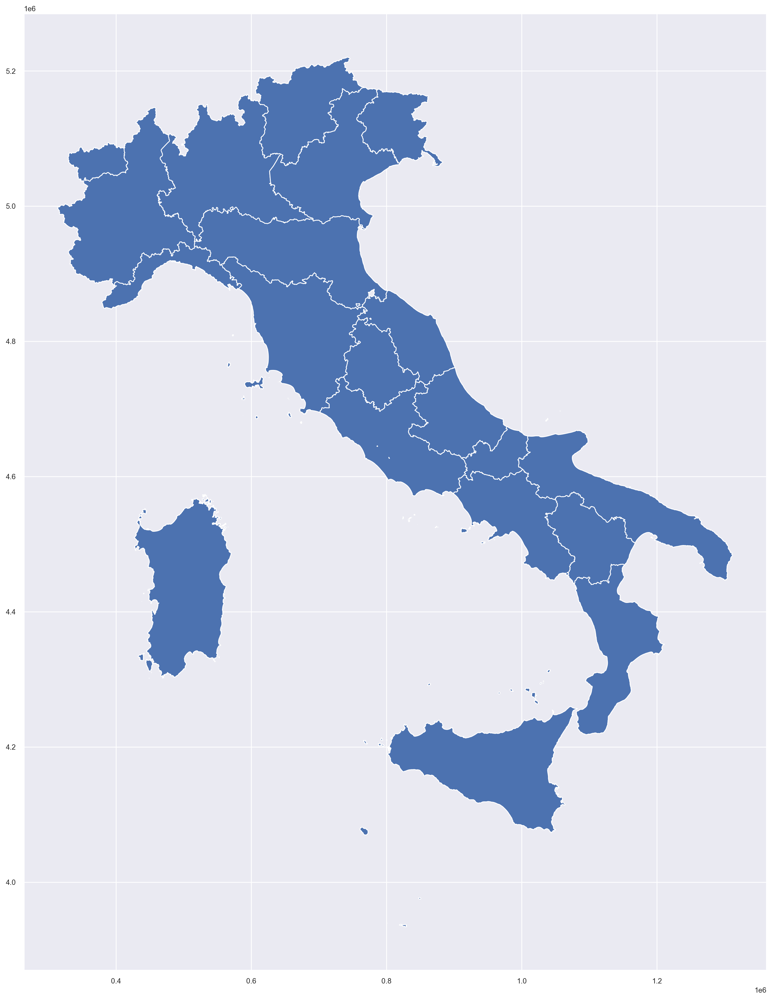

In [11]:
italy.plot(figsize = (20,20))

## description to be added  
  
   <br/><br/>






In [12]:
# define subsets by geographic area
df_nw = df[df['Geographic Area'] == 'North-West']
df_ne = df[df['Geographic Area'] == 'North-East']
df_cw = df[df['Geographic Area'] == 'Central-West']
df_ce = df[df['Geographic Area'] == 'Central-East']
df_so = df[df['Geographic Area'] == 'South']
df_is = df[df['Geographic Area'] == 'Islands']

In [13]:
# define subsets for regional annual aircraft movements
mov_dom_year_nw = df_nw.groupby('Year')['MOV - Domestic'].sum().reset_index()
mov_dom_year_ne = df_ne.groupby('Year')['MOV - Domestic'].sum().reset_index()
mov_dom_year_cw = df_cw.groupby('Year')['MOV - Domestic'].sum().reset_index()
mov_dom_year_ce = df_ce.groupby('Year')['MOV - Domestic'].sum().reset_index()
mov_dom_year_so = df_so.groupby('Year')['MOV - Domestic'].sum().reset_index()
mov_dom_year_is = df_is.groupby('Year')['MOV - Domestic'].sum().reset_index()
mov_int_year_nw = df_nw.groupby('Year')['MOV - International'].sum().reset_index()
mov_int_year_ne = df_ne.groupby('Year')['MOV - International'].sum().reset_index()
mov_int_year_cw = df_cw.groupby('Year')['MOV - International'].sum().reset_index()
mov_int_year_ce = df_ce.groupby('Year')['MOV - International'].sum().reset_index()
mov_int_year_so = df_so.groupby('Year')['MOV - International'].sum().reset_index()
mov_int_year_is = df_is.groupby('Year')['MOV - International'].sum().reset_index()
mov_EU_year_nw = df_nw.groupby('Year')['MOV - EU'].sum().reset_index()
mov_EU_year_ne = df_ne.groupby('Year')['MOV - EU'].sum().reset_index()
mov_EU_year_cw = df_cw.groupby('Year')['MOV - EU'].sum().reset_index()
mov_EU_year_ce = df_ce.groupby('Year')['MOV - EU'].sum().reset_index()
mov_EU_year_so = df_so.groupby('Year')['MOV - EU'].sum().reset_index()
mov_EU_year_is = df_is.groupby('Year')['MOV - EU'].sum().reset_index()
mov_gen_year_nw = df_nw.groupby('Year')['MOV - General Avio'].sum().reset_index()
mov_gen_year_ne = df_ne.groupby('Year')['MOV - General Avio'].sum().reset_index()
mov_gen_year_cw = df_cw.groupby('Year')['MOV - General Avio'].sum().reset_index()
mov_gen_year_ce = df_ce.groupby('Year')['MOV - General Avio'].sum().reset_index()
mov_gen_year_so = df_so.groupby('Year')['MOV - General Avio'].sum().reset_index()
mov_gen_year_is = df_is.groupby('Year')['MOV - General Avio'].sum().reset_index()
mov_tot_year_nw = df_nw.groupby('Year')['MOV - Total'].sum().reset_index()
mov_tot_year_ne = df_ne.groupby('Year')['MOV - Total'].sum().reset_index()
mov_tot_year_cw = df_cw.groupby('Year')['MOV - Total'].sum().reset_index()
mov_tot_year_ce = df_ce.groupby('Year')['MOV - Total'].sum().reset_index()
mov_tot_year_so = df_so.groupby('Year')['MOV - Total'].sum().reset_index()
mov_tot_year_is = df_is.groupby('Year')['MOV - Total'].sum().reset_index()

# define subsets for regional annual passengers 
pax_dom_year_nw = df_nw.groupby('Year')['PAX - Domestic'].sum().reset_index()
pax_dom_year_ne = df_ne.groupby('Year')['PAX - Domestic'].sum().reset_index()
pax_dom_year_cw = df_cw.groupby('Year')['PAX - Domestic'].sum().reset_index()
pax_dom_year_ce = df_ce.groupby('Year')['PAX - Domestic'].sum().reset_index()
pax_dom_year_so = df_so.groupby('Year')['PAX - Domestic'].sum().reset_index()
pax_dom_year_is = df_is.groupby('Year')['PAX - Domestic'].sum().reset_index()
pax_int_year_nw = df_nw.groupby('Year')['PAX - International'].sum().reset_index()
pax_int_year_ne = df_ne.groupby('Year')['PAX - International'].sum().reset_index()
pax_int_year_cw = df_cw.groupby('Year')['PAX - International'].sum().reset_index()
pax_int_year_ce = df_ce.groupby('Year')['PAX - International'].sum().reset_index()
pax_int_year_so = df_so.groupby('Year')['PAX - International'].sum().reset_index()
pax_int_year_is = df_is.groupby('Year')['PAX - International'].sum().reset_index()
pax_EU_year_nw = df_nw.groupby('Year')['PAX - EU'].sum().reset_index()
pax_EU_year_ne = df_ne.groupby('Year')['PAX - EU'].sum().reset_index()
pax_EU_year_cw = df_cw.groupby('Year')['PAX - EU'].sum().reset_index()
pax_EU_year_ce = df_ce.groupby('Year')['PAX - EU'].sum().reset_index()
pax_EU_year_so = df_so.groupby('Year')['PAX - EU'].sum().reset_index()
pax_EU_year_is = df_is.groupby('Year')['PAX - EU'].sum().reset_index()
pax_trs_year_nw = df_nw.groupby('Year')['PAX - Transit'].sum().reset_index()
pax_trs_year_ne = df_ne.groupby('Year')['PAX - Transit'].sum().reset_index()
pax_trs_year_cw = df_cw.groupby('Year')['PAX - Transit'].sum().reset_index()
pax_trs_year_ce = df_ce.groupby('Year')['PAX - Transit'].sum().reset_index()
pax_trs_year_so = df_so.groupby('Year')['PAX - Transit'].sum().reset_index()
pax_trs_year_is = df_is.groupby('Year')['PAX - Transit'].sum().reset_index()
pax_gen_year_nw = df_nw.groupby('Year')['PAX - General Avio'].sum().reset_index()
pax_gen_year_ne = df_ne.groupby('Year')['PAX - General Avio'].sum().reset_index()
pax_gen_year_cw = df_cw.groupby('Year')['PAX - General Avio'].sum().reset_index()
pax_gen_year_ce = df_ce.groupby('Year')['PAX - General Avio'].sum().reset_index()
pax_gen_year_so = df_so.groupby('Year')['PAX - General Avio'].sum().reset_index()
pax_gen_year_is = df_is.groupby('Year')['PAX - General Avio'].sum().reset_index()
pax_tot_year_nw = df_nw.groupby('Year')['PAX - Total'].sum().reset_index()
pax_tot_year_ne = df_ne.groupby('Year')['PAX - Total'].sum().reset_index()
pax_tot_year_cw = df_cw.groupby('Year')['PAX - Total'].sum().reset_index()
pax_tot_year_ce = df_ce.groupby('Year')['PAX - Total'].sum().reset_index()
pax_tot_year_so = df_so.groupby('Year')['PAX - Total'].sum().reset_index()
pax_tot_year_is = df_is.groupby('Year')['PAX - Total'].sum().reset_index()

# define subsets for regional annual freight
fre_avio_year_nw = df_nw.groupby('Year')['FRE - Goods Avio'].sum().reset_index()
fre_avio_year_ne = df_ne.groupby('Year')['FRE - Goods Avio'].sum().reset_index()
fre_avio_year_cw = df_cw.groupby('Year')['FRE - Goods Avio'].sum().reset_index()
fre_avio_year_ce = df_ce.groupby('Year')['FRE - Goods Avio'].sum().reset_index()
fre_avio_year_so = df_so.groupby('Year')['FRE - Goods Avio'].sum().reset_index()
fre_avio_year_is = df_is.groupby('Year')['FRE - Goods Avio'].sum().reset_index()
fre_grnd_year_nw = df_nw.groupby('Year')['FRE - Goods Ground'].sum().reset_index()
fre_grnd_year_ne = df_ne.groupby('Year')['FRE - Goods Ground'].sum().reset_index()
fre_grnd_year_cw = df_cw.groupby('Year')['FRE - Goods Ground'].sum().reset_index()
fre_grnd_year_ce = df_ce.groupby('Year')['FRE - Goods Ground'].sum().reset_index()
fre_grnd_year_so = df_so.groupby('Year')['FRE - Goods Ground'].sum().reset_index()
fre_grnd_year_is = df_is.groupby('Year')['FRE - Goods Ground'].sum().reset_index()
fre_mail_year_nw = df_nw.groupby('Year')['FRE - Mail'].sum().reset_index()
fre_mail_year_ne = df_ne.groupby('Year')['FRE - Mail'].sum().reset_index()
fre_mail_year_cw = df_cw.groupby('Year')['FRE - Mail'].sum().reset_index()
fre_mail_year_ce = df_ce.groupby('Year')['FRE - Mail'].sum().reset_index()
fre_mail_year_so = df_so.groupby('Year')['FRE - Mail'].sum().reset_index()
fre_mail_year_is = df_is.groupby('Year')['FRE - Mail'].sum().reset_index()
fre_tot_year_nw = df_nw.groupby('Year')['FRE - Total'].sum().reset_index()
fre_tot_year_ne = df_ne.groupby('Year')['FRE - Total'].sum().reset_index()
fre_tot_year_cw = df_cw.groupby('Year')['FRE - Total'].sum().reset_index()
fre_tot_year_ce = df_ce.groupby('Year')['FRE - Total'].sum().reset_index()
fre_tot_year_so = df_so.groupby('Year')['FRE - Total'].sum().reset_index()
fre_tot_year_is = df_is.groupby('Year')['FRE - Total'].sum().reset_index()

In [14]:
# define a function to create regional and local subsets




In [15]:
# define subsets for geographic areas
mov_tot_geo = df.groupby(['Year', 'Geographic Area'])['MOV - Total'].sum().reset_index()
pax_tot_geo = df.groupby(['Year', 'Geographic Area'])['PAX - Total'].sum().reset_index()
fre_tot_geo = df.groupby(['Year', 'Geographic Area'])['FRE - Total'].sum().reset_index()

In [16]:
# create colour mapping based on all unique values of geographic areas
areas = df['Geographic Area'].unique()
colours_geo = sns.color_palette('hsv', n_colors=len(areas))  # get a number of colours
cmap_geo = dict(zip(areas, colours_geo))  # zip values to colours

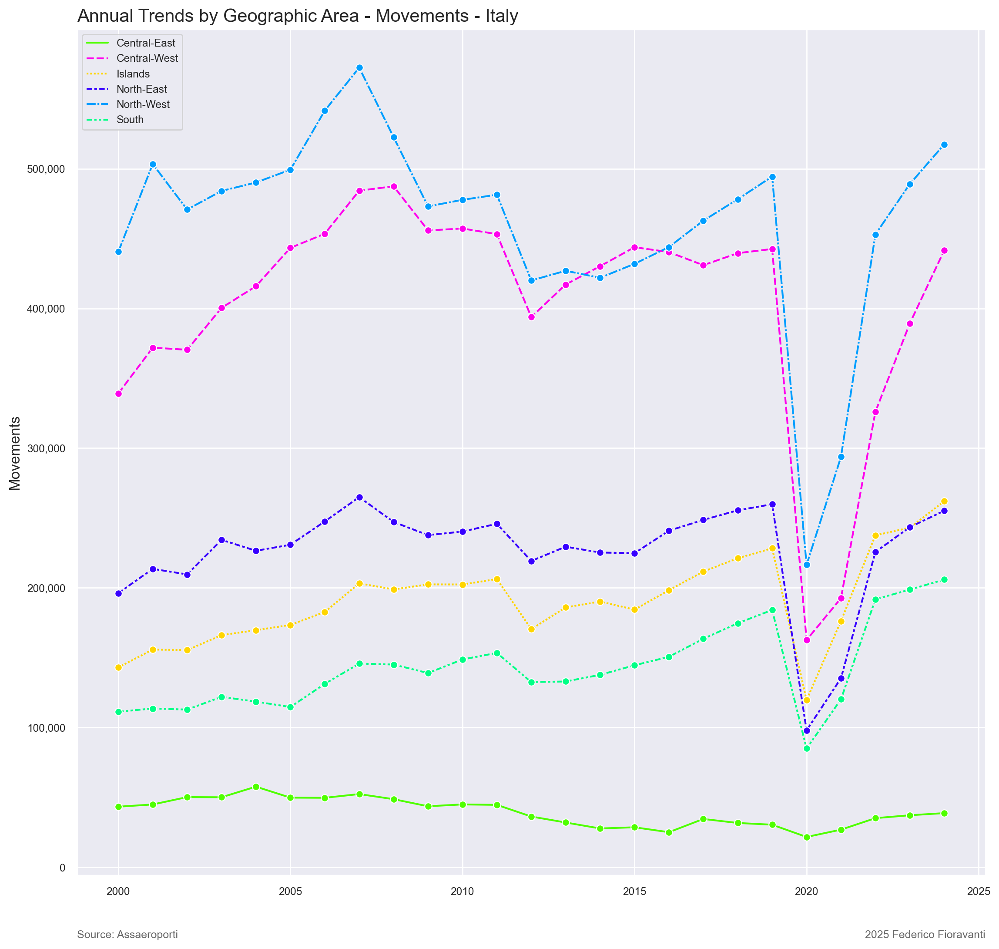

In [35]:
# plot the time series for annual movements by geographic area
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Geographic Area - Movements - Italy', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
# plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.set(xlabel=None)

# p = sns.lineplot(data=mov_tot_year, x='Year', y='MOV - Total', color='black', ci=None, marker='o',
#                 label='Total', ax=ax)
p = sns.lineplot(data=mov_tot_geo, x='Year', y='MOV - Total', hue='Geographic Area', style='Geographic Area',
                 palette=cmap_geo, marker='o', ax=ax)
p.set(xlabel=None)


plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

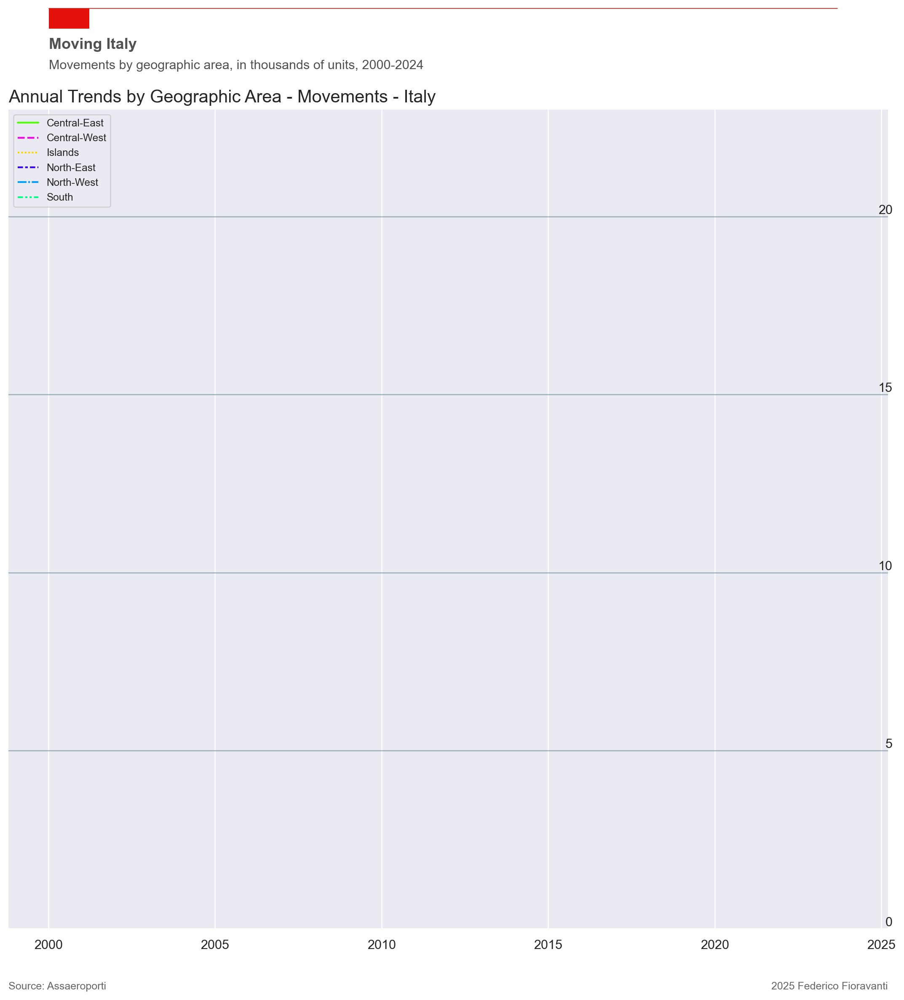

In [90]:
# plot the time series for annual movements by geographic area
fig, ax = plt.subplots(figsize = (12,12))

# create grid 
# zorder tells it which layer to put it on. We are setting this to 1 and our data to 2 so the grid is behind the data.
ax.grid(which="major", axis='y', color='#758D99', alpha=0.6, zorder=1)

# remove splines. Can be done one at a time or can slice with a list.
ax.spines[['top','right','left']].set_visible(False)

# shrink y-lim to make plot a bit tighter
ax.set_ylim(0, 23)



# reformat x-axis tick labels
ax.xaxis.set_tick_params(labelsize=11)           # set tick label size

# reformat y-axis tick labels
ax.set_yticklabels(np.arange(0,25,5),            # set labels again
                   ha = 'right',                 # set horizontal alignment to right
                   verticalalignment='bottom')   # set vertical alignment to make labels on top of gridline      

ax.yaxis.set_tick_params(pad=-2,                 # pad tick labels so they don't go over y-axis
                         labeltop=True,          # put x-axis labels on top
                         labelbottom=False,      # set no x-axis labels on bottom
                         bottom=False,           # set no ticks on bottom
                         labelsize=11)           # set tick label size



# add in line and tag
ax.plot([0.12, .9],                              # set width of line
        [.98, .98],                              # set height of line
        transform=fig.transFigure,               # set location relative to plot
        clip_on=False, 
        color='#E3120B', 
        linewidth=.6)
ax.add_patch(plt.Rectangle((0.12,.98),                 # set location of rectangle by lower left corder
                           0.04,                       # width of rectangle
                           -0.02,                      # height of rectangle. Negative so it goes down.
                           facecolor='#E3120B', 
                           transform=fig.transFigure, 
                           clip_on=False, 
                           linewidth = 0))

# add in title and subtitle
ax.text(x=0.12, y=.94, s="Moving Italy", transform=fig.transFigure, ha='left', fontsize=13, weight='bold', alpha=.8)
ax.text(x=0.12, y=.92, s="Movements by geographic area, in thousands of units, 2000-2024", transform=fig.transFigure, ha='left', fontsize=11, alpha=.8)





plt.title('Annual Trends by Geographic Area - Movements - Italy', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
# plt.ticklabel_format(style='plain', axis='y')
# plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.set(xlabel=None)


# p = sns.lineplot(data=mov_tot_year, x='Year', y='MOV - Total', color='black', ci=None, marker='o',
#                 label='Total', ax=ax)
p = sns.lineplot(data=mov_tot_geo, x='Year', y='MOV - Total', hue='Geographic Area', style='Geographic Area',
                 palette=cmap_geo, marker='o', ax=ax)
p.set(xlabel=None)
p.set(ylabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

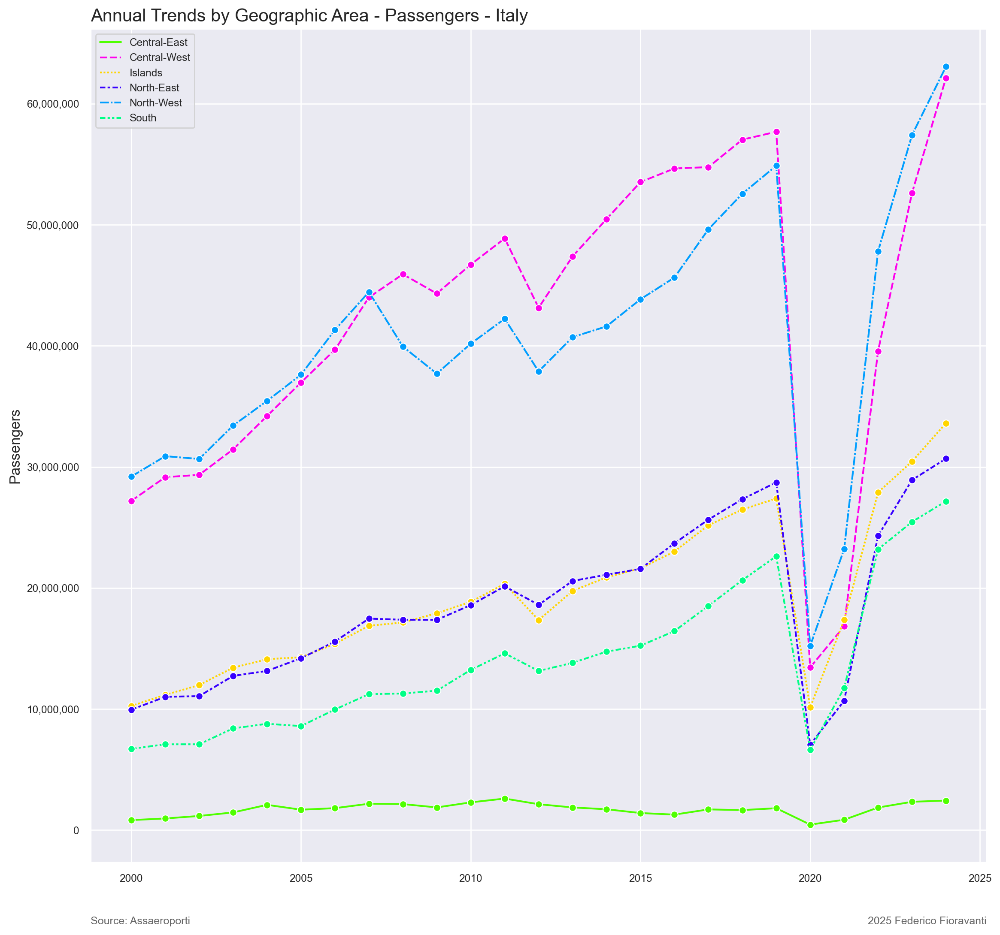

In [36]:
# plot the time series for annual passengers by geographic area
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Geographic Area - Passengers - Italy', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=pax_tot_geo, x='Year', y='PAX - Total', hue='Geographic Area', style='Geographic Area',
                 palette=cmap_geo, marker='o', ax=ax)
p.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

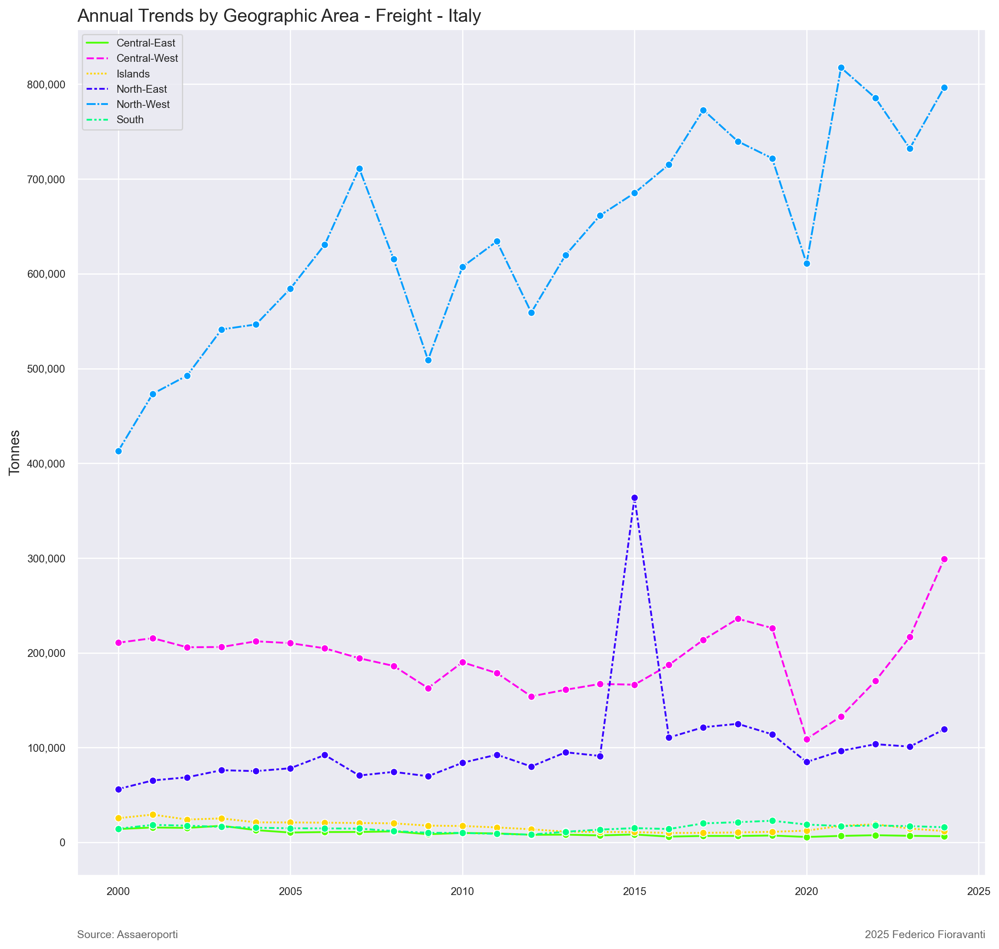

In [37]:
# plot the time series for annual freight by geographic area
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Geographic Area - Freight - Italy', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=fre_tot_geo, x='Year', y='FRE - Total', hue='Geographic Area', style='Geographic Area',
                 palette=cmap_geo, marker='o', ax=ax)
p.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

In [20]:
# comments to be added



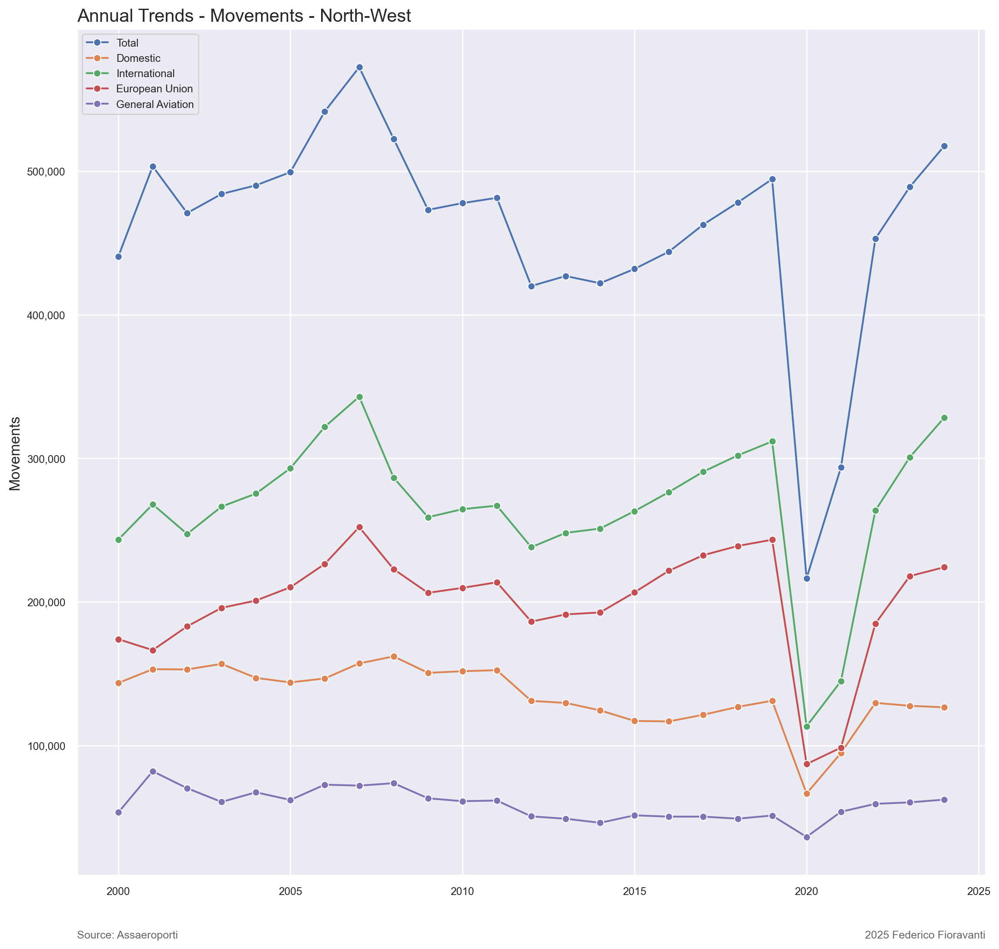

In [38]:
# plot the time series for North-West annual movements 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Movements - North-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=mov_tot_year_nw, x='Year', y='MOV - Total', marker='o', label='Total')
sns.lineplot(data=mov_dom_year_nw, x='Year', y='MOV - Domestic', marker='o', label='Domestic')
sns.lineplot(data=mov_int_year_nw, x='Year', y='MOV - International', marker='o', label='International')
sns.lineplot(data=mov_EU_year_nw, x='Year', y='MOV - EU', marker='o', label='European Union')
sns.lineplot(data=mov_gen_year_nw, x='Year', y='MOV - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

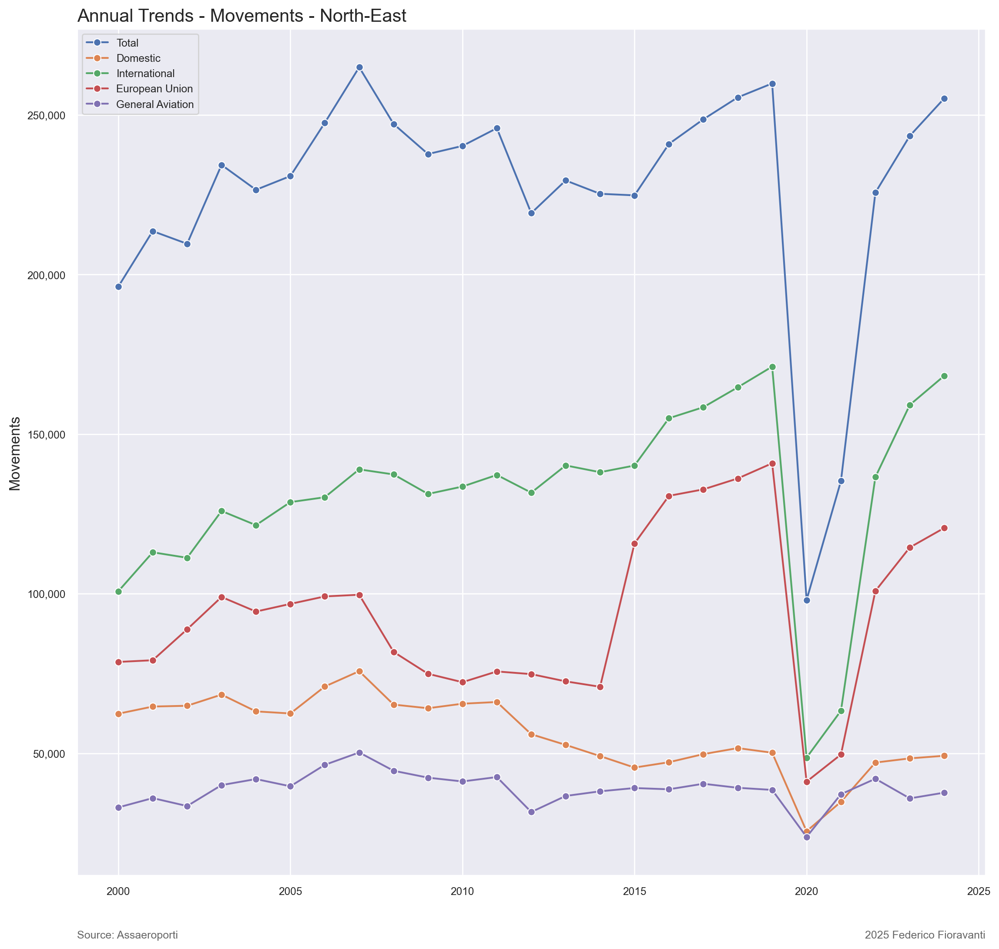

In [39]:
# plot the time series for North-East annual movements 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Movements - North-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=mov_tot_year_ne, x='Year', y='MOV - Total', marker='o', label='Total')
sns.lineplot(data=mov_dom_year_ne, x='Year', y='MOV - Domestic', marker='o', label='Domestic')
sns.lineplot(data=mov_int_year_ne, x='Year', y='MOV - International', marker='o', label='International')
sns.lineplot(data=mov_EU_year_ne, x='Year', y='MOV - EU', marker='o', label='European Union')
sns.lineplot(data=mov_gen_year_ne, x='Year', y='MOV - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

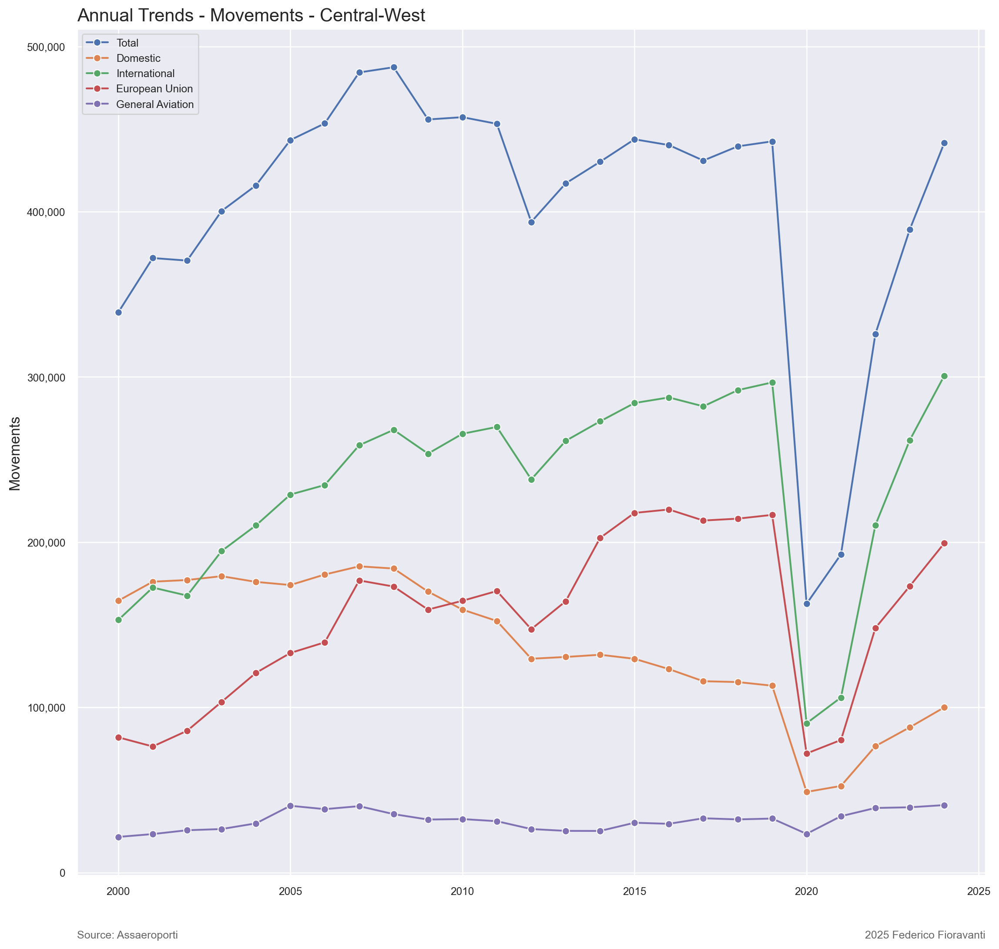

In [40]:
# plot the time series for Central-West annual movements 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Movements - Central-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=mov_tot_year_cw, x='Year', y='MOV - Total', marker='o', label='Total')
sns.lineplot(data=mov_dom_year_cw, x='Year', y='MOV - Domestic', marker='o', label='Domestic')
sns.lineplot(data=mov_int_year_cw, x='Year', y='MOV - International', marker='o', label='International')
sns.lineplot(data=mov_EU_year_cw, x='Year', y='MOV - EU', marker='o', label='European Union')
sns.lineplot(data=mov_gen_year_cw, x='Year', y='MOV - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

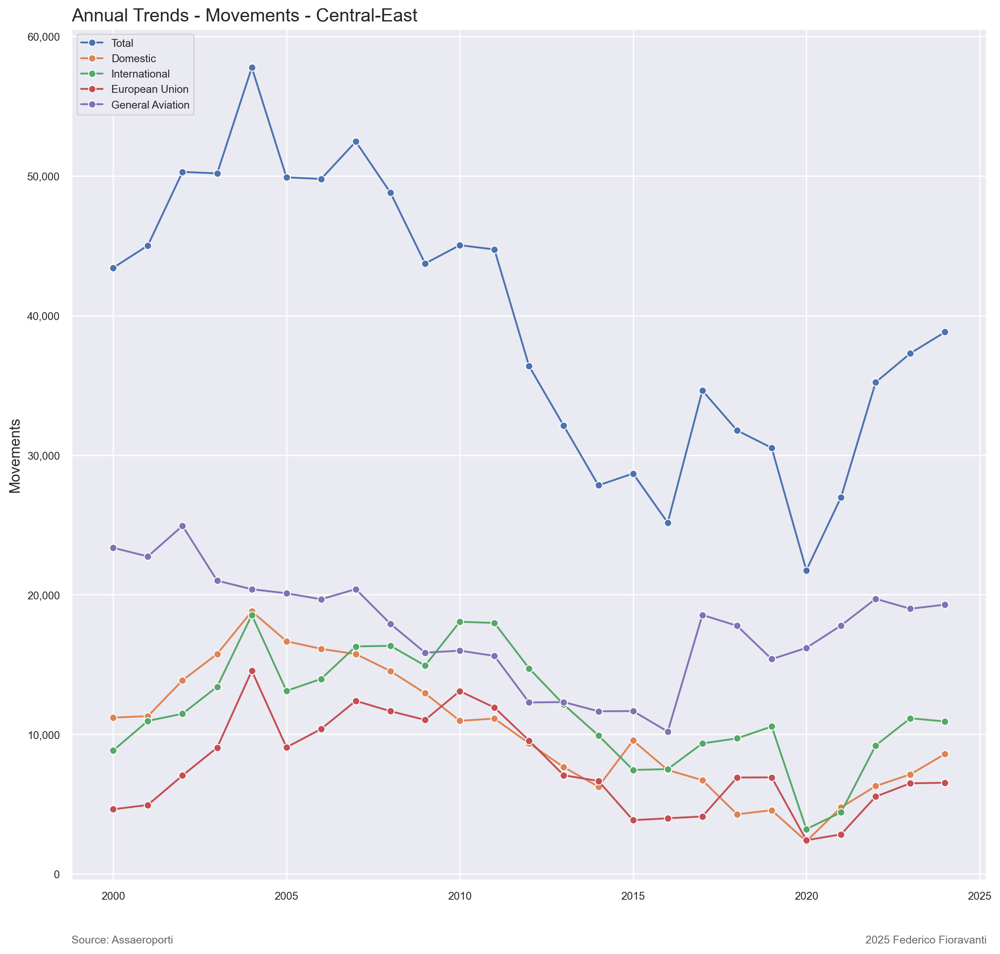

In [41]:
# plot the time series for Central-East annual movements 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Movements - Central-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=mov_tot_year_ce, x='Year', y='MOV - Total', marker='o', label='Total')
sns.lineplot(data=mov_dom_year_ce, x='Year', y='MOV - Domestic', marker='o', label='Domestic')
sns.lineplot(data=mov_int_year_ce, x='Year', y='MOV - International', marker='o', label='International')
sns.lineplot(data=mov_EU_year_ce, x='Year', y='MOV - EU', marker='o', label='European Union')
sns.lineplot(data=mov_gen_year_ce, x='Year', y='MOV - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

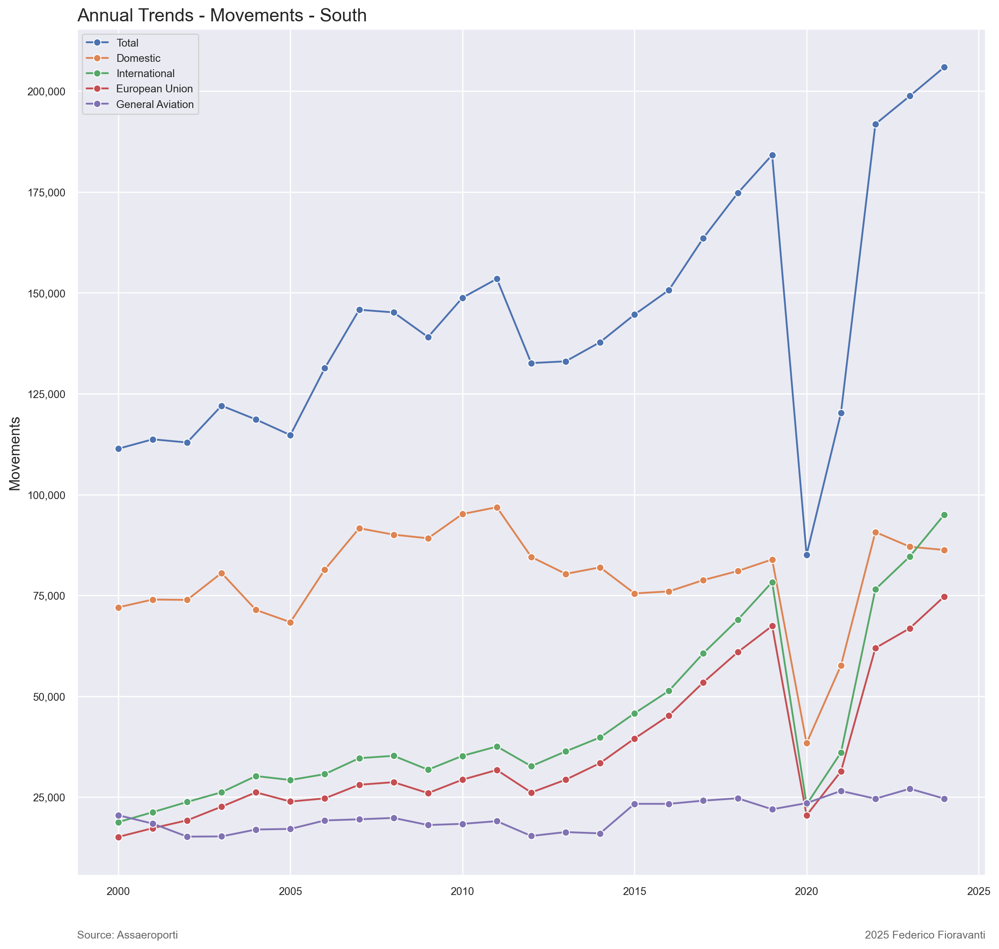

In [42]:
# plot the time series for South annual movements 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Movements - South', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=mov_tot_year_so, x='Year', y='MOV - Total', marker='o', label='Total')
sns.lineplot(data=mov_dom_year_so, x='Year', y='MOV - Domestic', marker='o', label='Domestic')
sns.lineplot(data=mov_int_year_so, x='Year', y='MOV - International', marker='o', label='International')
sns.lineplot(data=mov_EU_year_so, x='Year', y='MOV - EU', marker='o', label='European Union')
sns.lineplot(data=mov_gen_year_so, x='Year', y='MOV - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

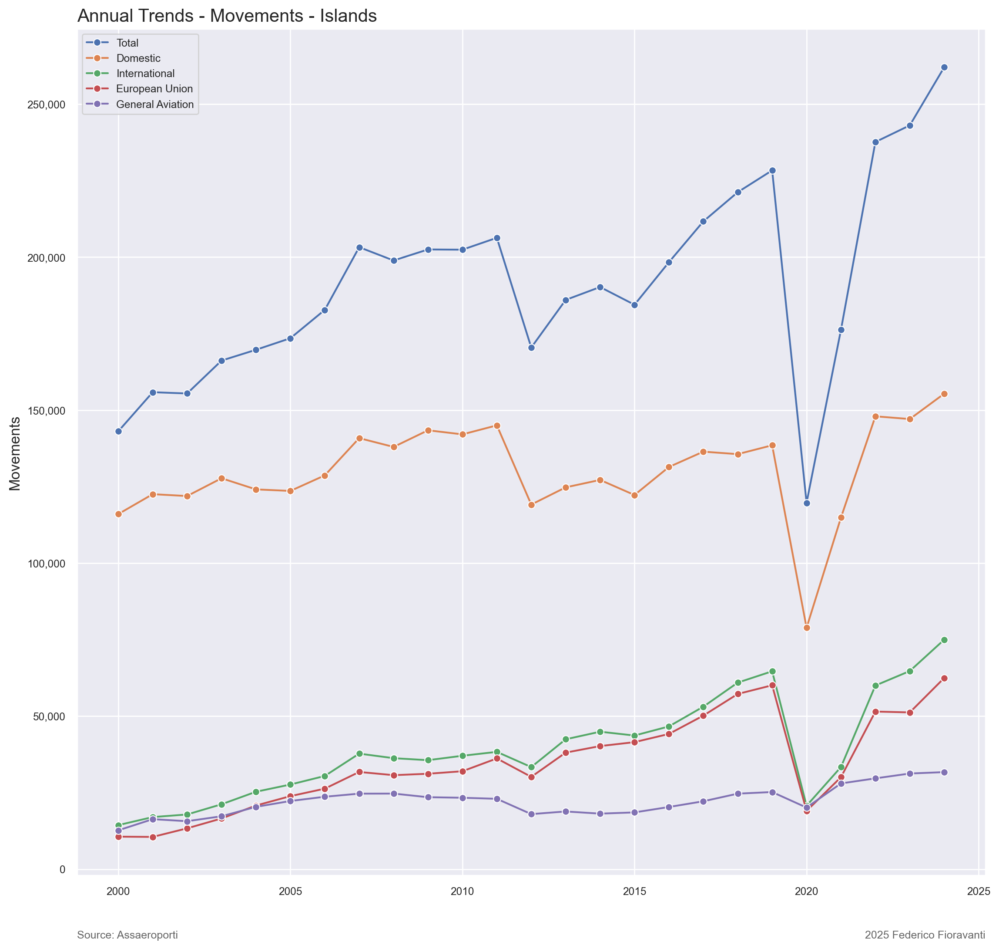

In [43]:
# plot the time series for Islands annual movements 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Movements - Islands', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=mov_tot_year_is, x='Year', y='MOV - Total', marker='o', label='Total')
sns.lineplot(data=mov_dom_year_is, x='Year', y='MOV - Domestic', marker='o', label='Domestic')
sns.lineplot(data=mov_int_year_is, x='Year', y='MOV - International', marker='o', label='International')
sns.lineplot(data=mov_EU_year_is, x='Year', y='MOV - EU', marker='o', label='European Union')
sns.lineplot(data=mov_gen_year_is, x='Year', y='MOV - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

In [27]:
# comments to be added




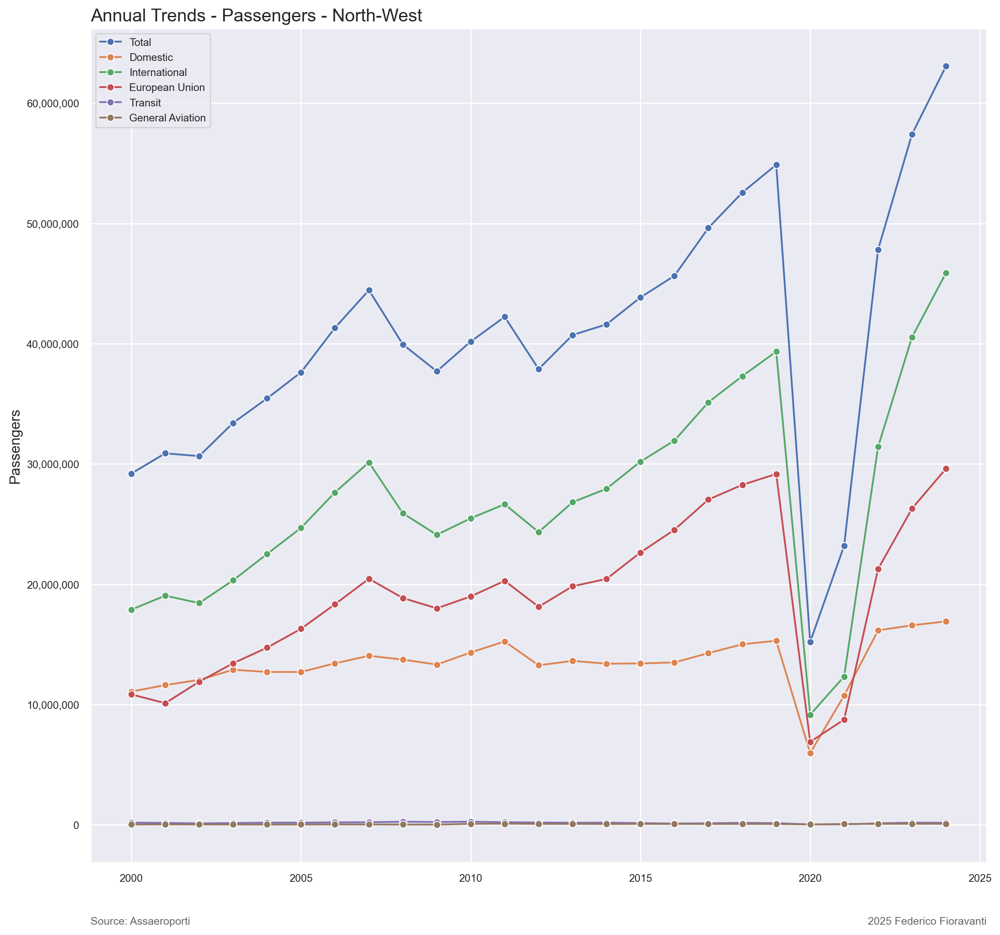

In [44]:
# plot the time series for North-West annual passengers 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Passengers - North-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=pax_tot_year_nw, x='Year', y='PAX - Total', marker='o', label='Total')
sns.lineplot(data=pax_dom_year_nw, x='Year', y='PAX - Domestic', marker='o', label='Domestic')
sns.lineplot(data=pax_int_year_nw, x='Year', y='PAX - International', marker='o', label='International')
sns.lineplot(data=pax_EU_year_nw, x='Year', y='PAX - EU', marker='o', label='European Union')
sns.lineplot(data=pax_trs_year_nw, x='Year', y='PAX - Transit', marker='o', label='Transit')
sns.lineplot(data=pax_gen_year_nw, x='Year', y='PAX - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

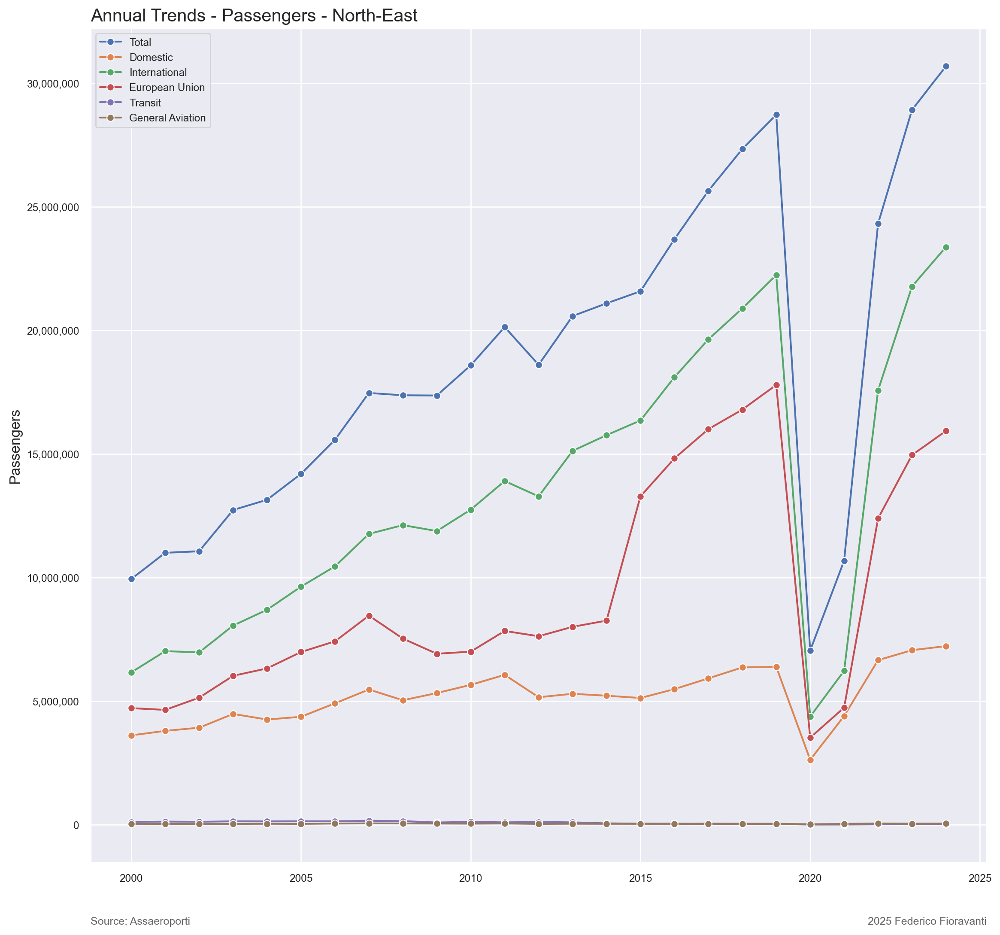

In [45]:
# plot the time series for North-East annual passengers 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Passengers - North-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=pax_tot_year_ne, x='Year', y='PAX - Total', marker='o', label='Total')
sns.lineplot(data=pax_dom_year_ne, x='Year', y='PAX - Domestic', marker='o', label='Domestic')
sns.lineplot(data=pax_int_year_ne, x='Year', y='PAX - International', marker='o', label='International')
sns.lineplot(data=pax_EU_year_ne, x='Year', y='PAX - EU', marker='o', label='European Union')
sns.lineplot(data=pax_trs_year_ne, x='Year', y='PAX - Transit', marker='o', label='Transit')
sns.lineplot(data=pax_gen_year_ne, x='Year', y='PAX - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

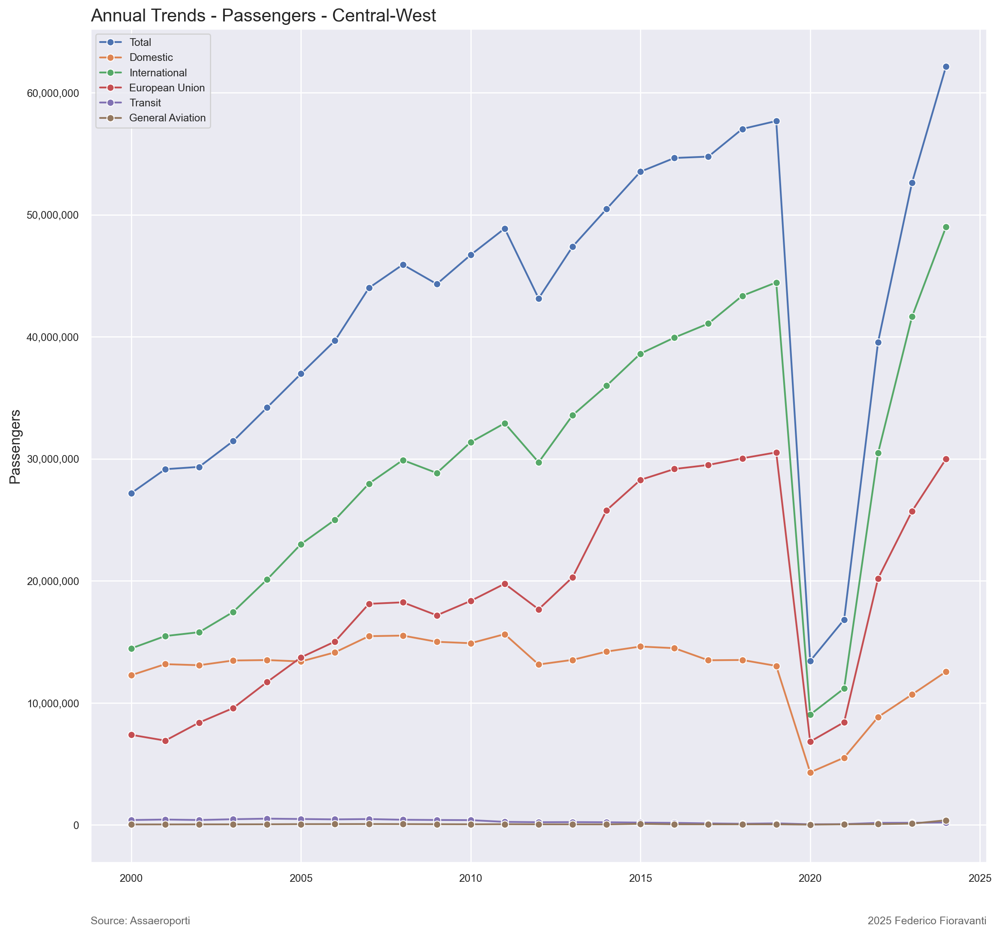

In [46]:
# plot the time series for Central-West annual passengers 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Passengers - Central-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=pax_tot_year_cw, x='Year', y='PAX - Total', marker='o', label='Total')
sns.lineplot(data=pax_dom_year_cw, x='Year', y='PAX - Domestic', marker='o', label='Domestic')
sns.lineplot(data=pax_int_year_cw, x='Year', y='PAX - International', marker='o', label='International')
sns.lineplot(data=pax_EU_year_cw, x='Year', y='PAX - EU', marker='o', label='European Union')
sns.lineplot(data=pax_trs_year_cw, x='Year', y='PAX - Transit', marker='o', label='Transit')
sns.lineplot(data=pax_gen_year_cw, x='Year', y='PAX - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

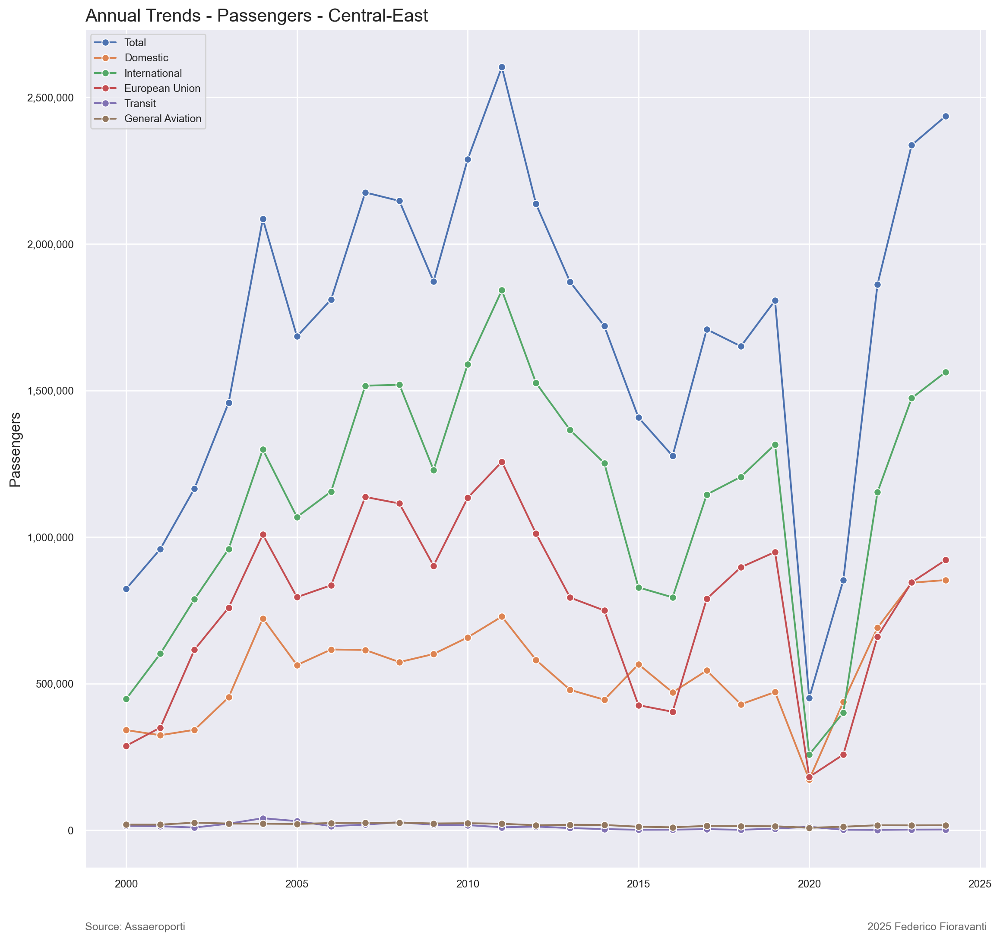

In [47]:
# plot the time series for Central-East annual passengers 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Passengers - Central-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=pax_tot_year_ce, x='Year', y='PAX - Total', marker='o', label='Total')
sns.lineplot(data=pax_dom_year_ce, x='Year', y='PAX - Domestic', marker='o', label='Domestic')
sns.lineplot(data=pax_int_year_ce, x='Year', y='PAX - International', marker='o', label='International')
sns.lineplot(data=pax_EU_year_ce, x='Year', y='PAX - EU', marker='o', label='European Union')
sns.lineplot(data=pax_trs_year_ce, x='Year', y='PAX - Transit', marker='o', label='Transit')
sns.lineplot(data=pax_gen_year_ce, x='Year', y='PAX - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

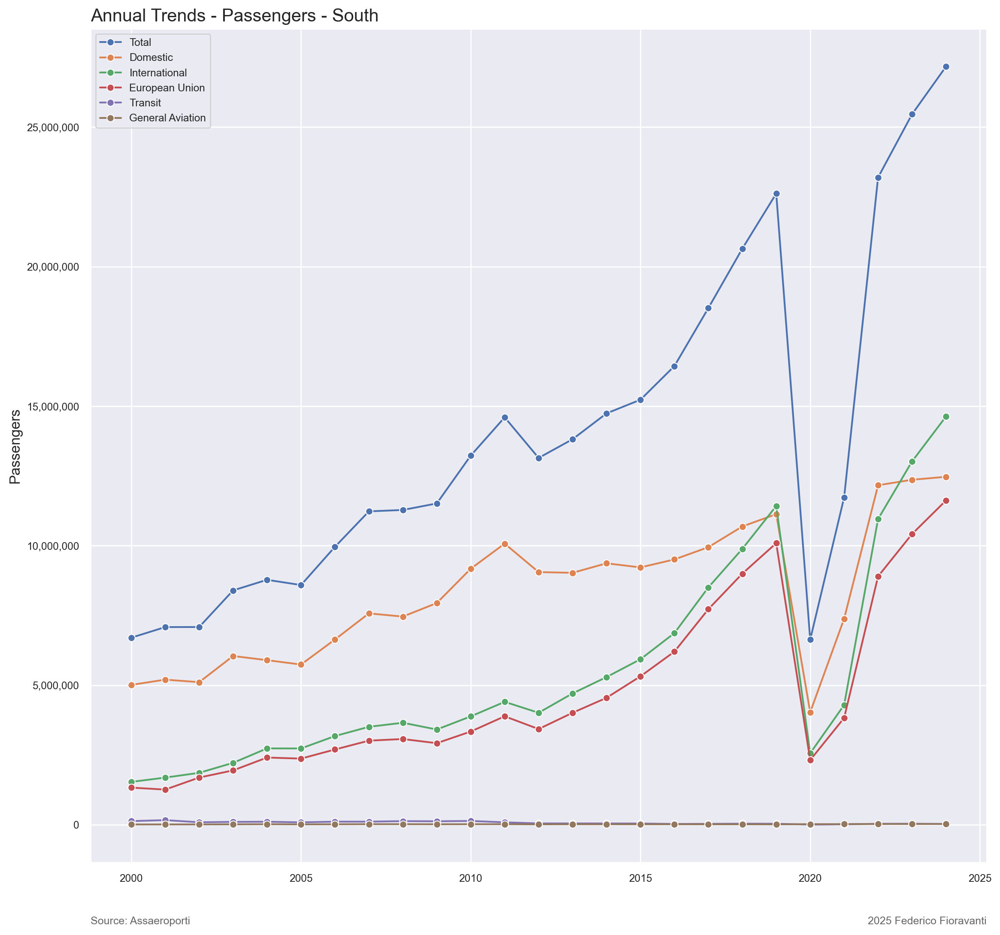

In [48]:
# plot the time series for South annual passengers 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Passengers - South', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=pax_tot_year_so, x='Year', y='PAX - Total', marker='o', label='Total')
sns.lineplot(data=pax_dom_year_so, x='Year', y='PAX - Domestic', marker='o', label='Domestic')
sns.lineplot(data=pax_int_year_so, x='Year', y='PAX - International', marker='o', label='International')
sns.lineplot(data=pax_EU_year_so, x='Year', y='PAX - EU', marker='o', label='European Union')
sns.lineplot(data=pax_trs_year_so, x='Year', y='PAX - Transit', marker='o', label='Transit')
sns.lineplot(data=pax_gen_year_so, x='Year', y='PAX - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

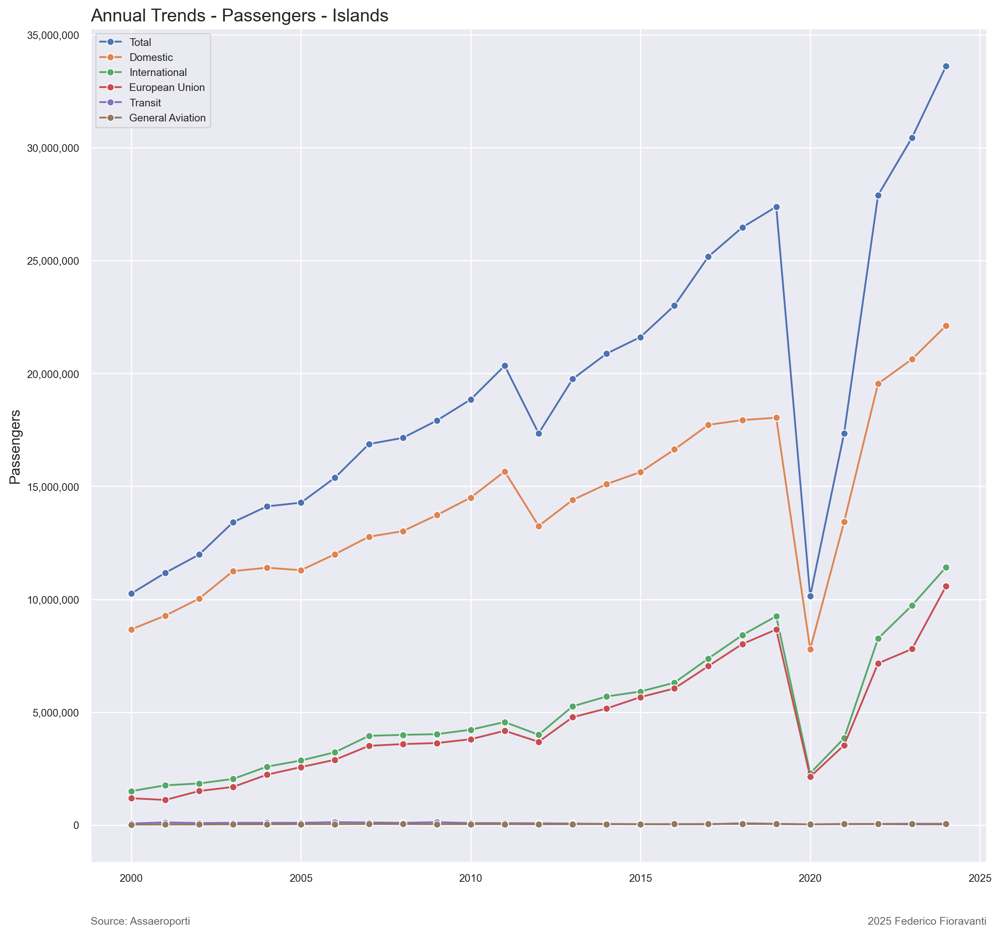

In [49]:
# plot the time series for Islands annual passengers 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Passengers - Islands', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=pax_tot_year_is, x='Year', y='PAX - Total', marker='o', label='Total')
sns.lineplot(data=pax_dom_year_is, x='Year', y='PAX - Domestic', marker='o', label='Domestic')
sns.lineplot(data=pax_int_year_is, x='Year', y='PAX - International', marker='o', label='International')
sns.lineplot(data=pax_EU_year_is, x='Year', y='PAX - EU', marker='o', label='European Union')
sns.lineplot(data=pax_trs_year_is, x='Year', y='PAX - Transit', marker='o', label='Transit')
sns.lineplot(data=pax_gen_year_is, x='Year', y='PAX - General Avio', marker='o', label='General Aviation')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

In [34]:
# comments to be added




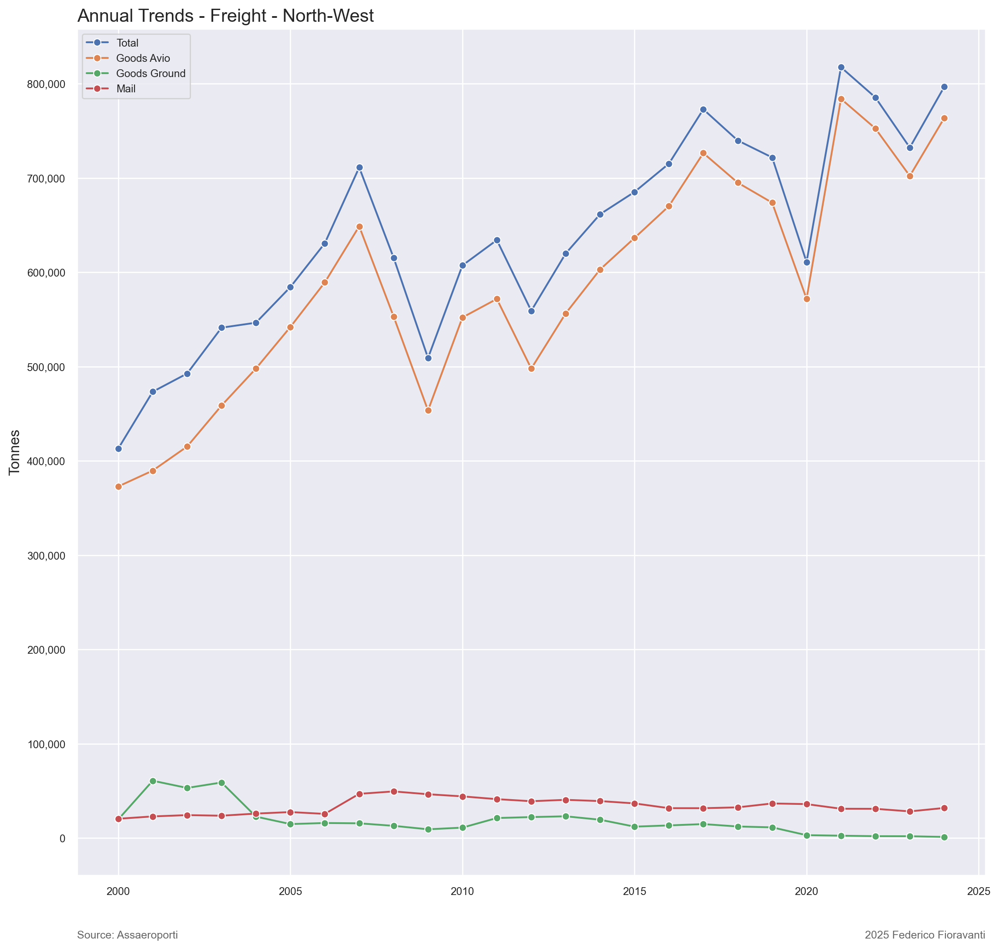

In [50]:
# plot the time series for North-West annual freight 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Freight - North-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=fre_tot_year_nw, x='Year', y='FRE - Total', marker='o', label='Total')
sns.lineplot(data=fre_avio_year_nw, x='Year', y='FRE - Goods Avio', marker='o', label='Goods Avio')
sns.lineplot(data=fre_grnd_year_nw, x='Year', y='FRE - Goods Ground', marker='o', label='Goods Ground')
sns.lineplot(data=fre_mail_year_nw, x='Year', y='FRE - Mail', marker='o', label='Mail')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

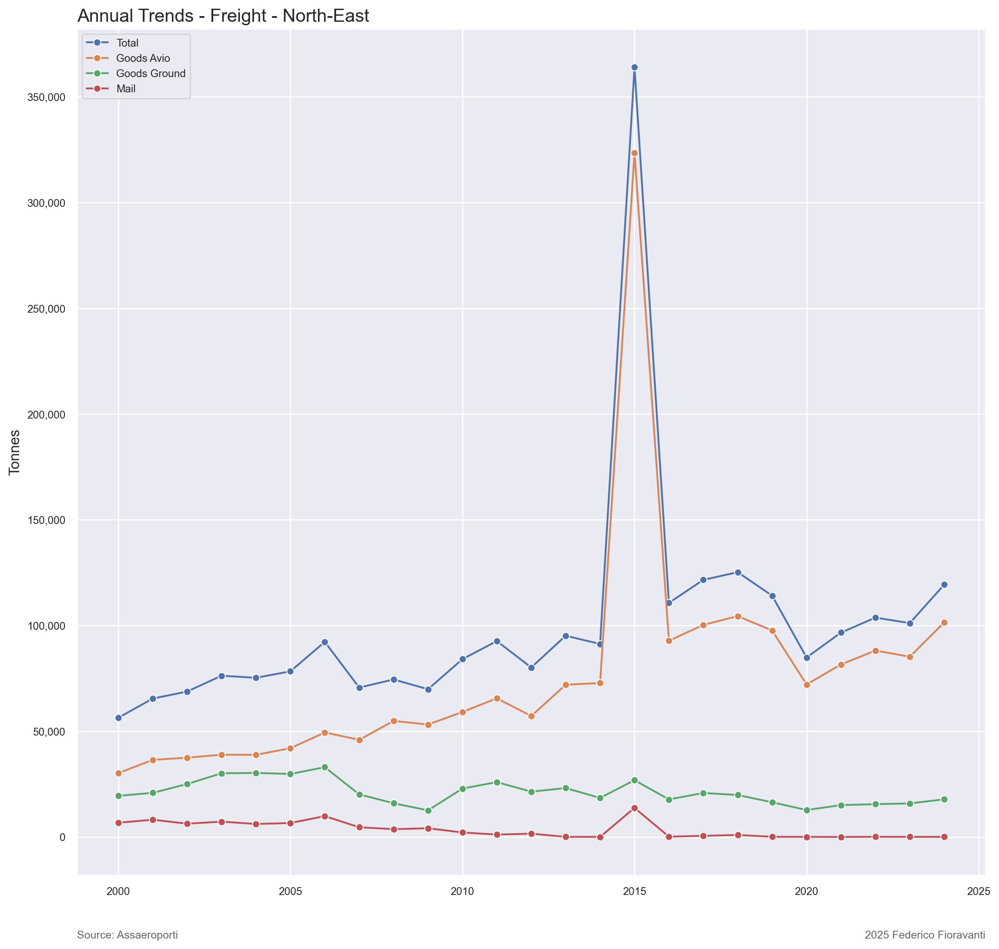

In [51]:
# plot the time series for North-East annual freight 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Freight - North-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=fre_tot_year_ne, x='Year', y='FRE - Total', marker='o', label='Total')
sns.lineplot(data=fre_avio_year_ne, x='Year', y='FRE - Goods Avio', marker='o', label='Goods Avio')
sns.lineplot(data=fre_grnd_year_ne, x='Year', y='FRE - Goods Ground', marker='o', label='Goods Ground')
sns.lineplot(data=fre_mail_year_ne, x='Year', y='FRE - Mail', marker='o', label='Mail')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

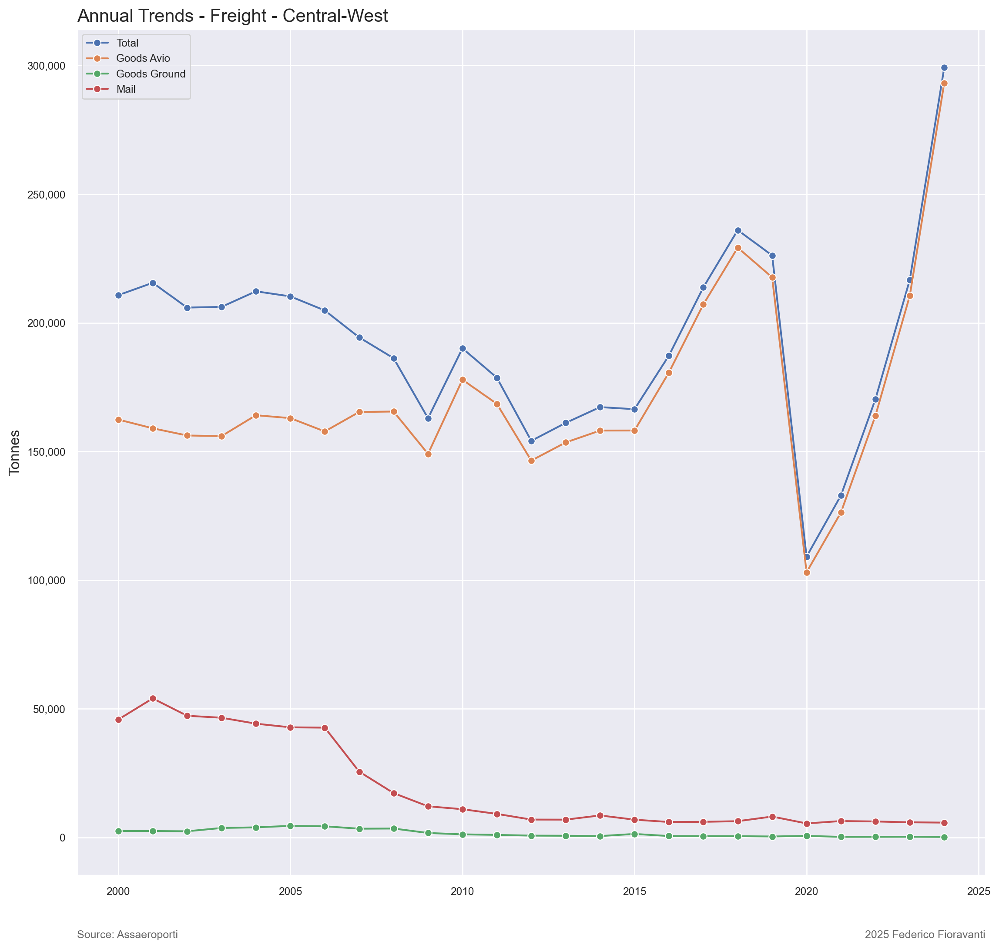

In [52]:
# plot the time series for Central-West annual freight 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Freight - Central-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=fre_tot_year_cw, x='Year', y='FRE - Total', marker='o', label='Total')
sns.lineplot(data=fre_avio_year_cw, x='Year', y='FRE - Goods Avio', marker='o', label='Goods Avio')
sns.lineplot(data=fre_grnd_year_cw, x='Year', y='FRE - Goods Ground', marker='o', label='Goods Ground')
sns.lineplot(data=fre_mail_year_cw, x='Year', y='FRE - Mail', marker='o', label='Mail')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

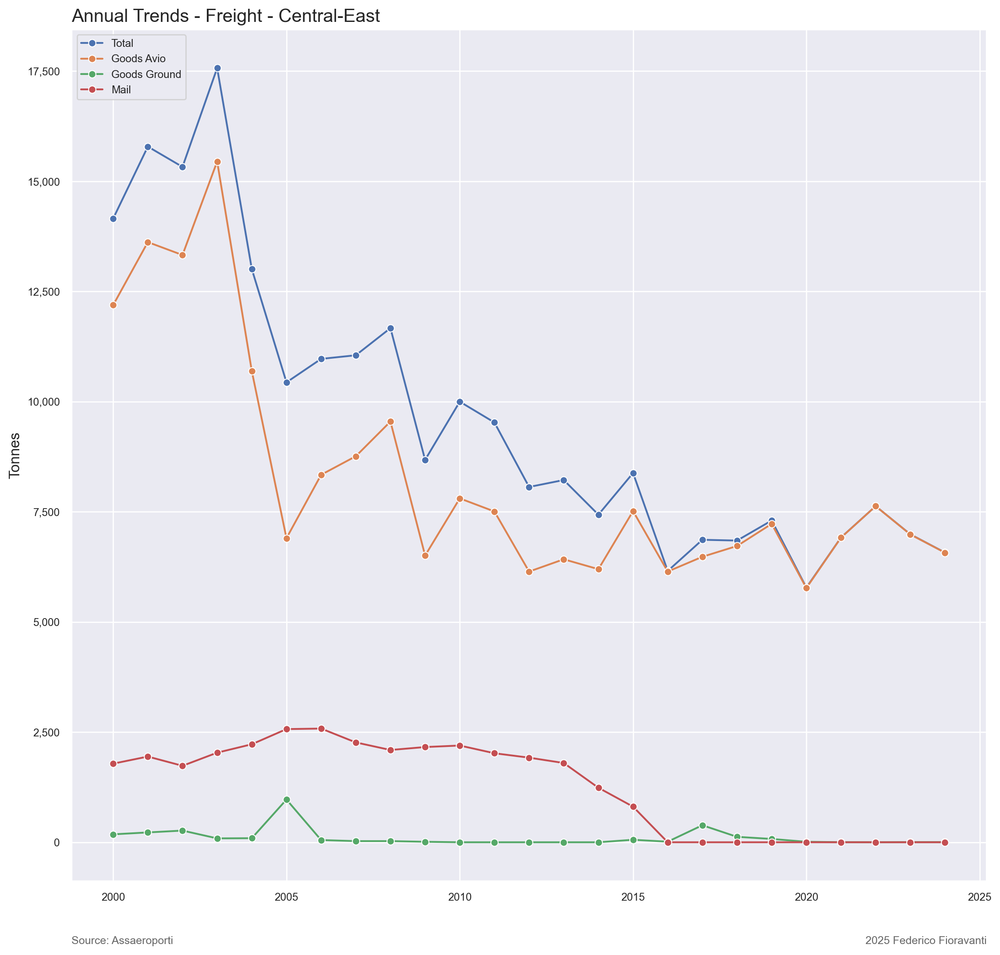

In [53]:
# plot the time series for Central-East annual freight 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Freight - Central-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=fre_tot_year_ce, x='Year', y='FRE - Total', marker='o', label='Total')
sns.lineplot(data=fre_avio_year_ce, x='Year', y='FRE - Goods Avio', marker='o', label='Goods Avio')
sns.lineplot(data=fre_grnd_year_ce, x='Year', y='FRE - Goods Ground', marker='o', label='Goods Ground')
sns.lineplot(data=fre_mail_year_ce, x='Year', y='FRE - Mail', marker='o', label='Mail')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

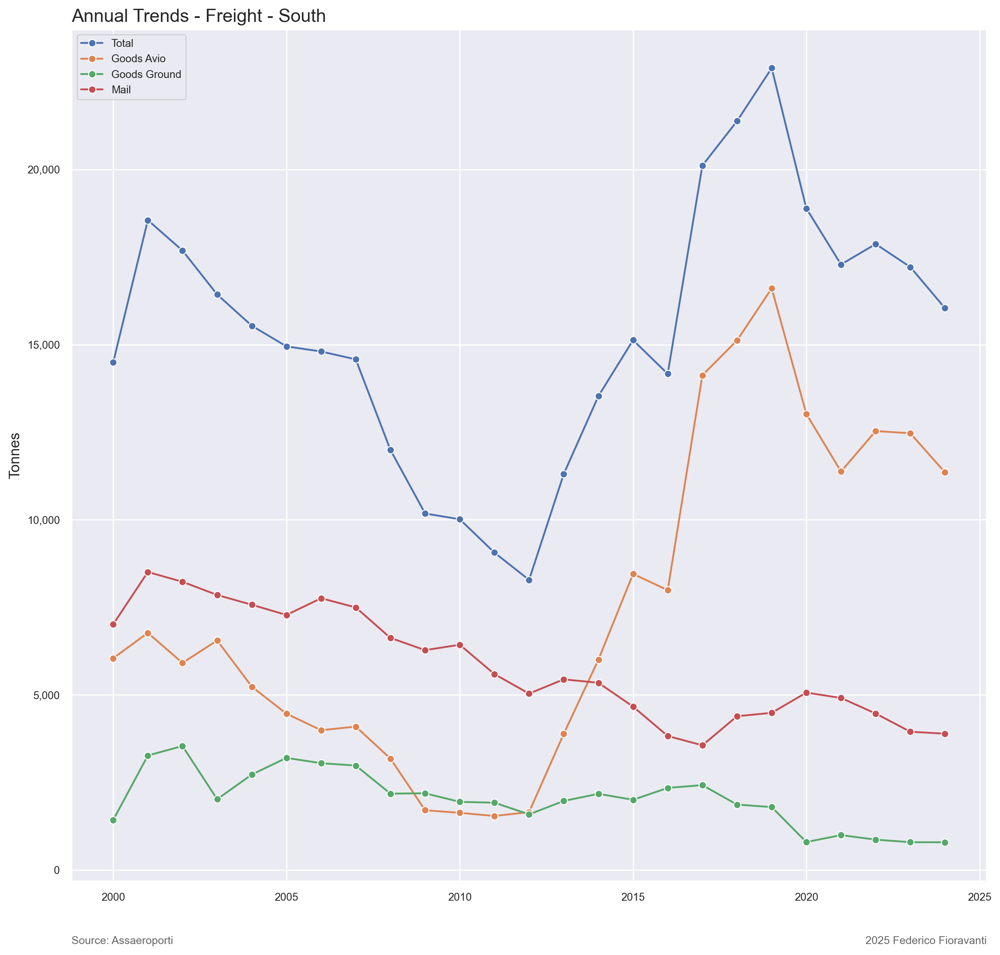

In [54]:
# plot the time series for South annual freight 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Freight - South', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=fre_tot_year_so, x='Year', y='FRE - Total', marker='o', label='Total')
sns.lineplot(data=fre_avio_year_so, x='Year', y='FRE - Goods Avio', marker='o', label='Goods Avio')
sns.lineplot(data=fre_grnd_year_so, x='Year', y='FRE - Goods Ground', marker='o', label='Goods Ground')
sns.lineplot(data=fre_mail_year_so, x='Year', y='FRE - Mail', marker='o', label='Mail')

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

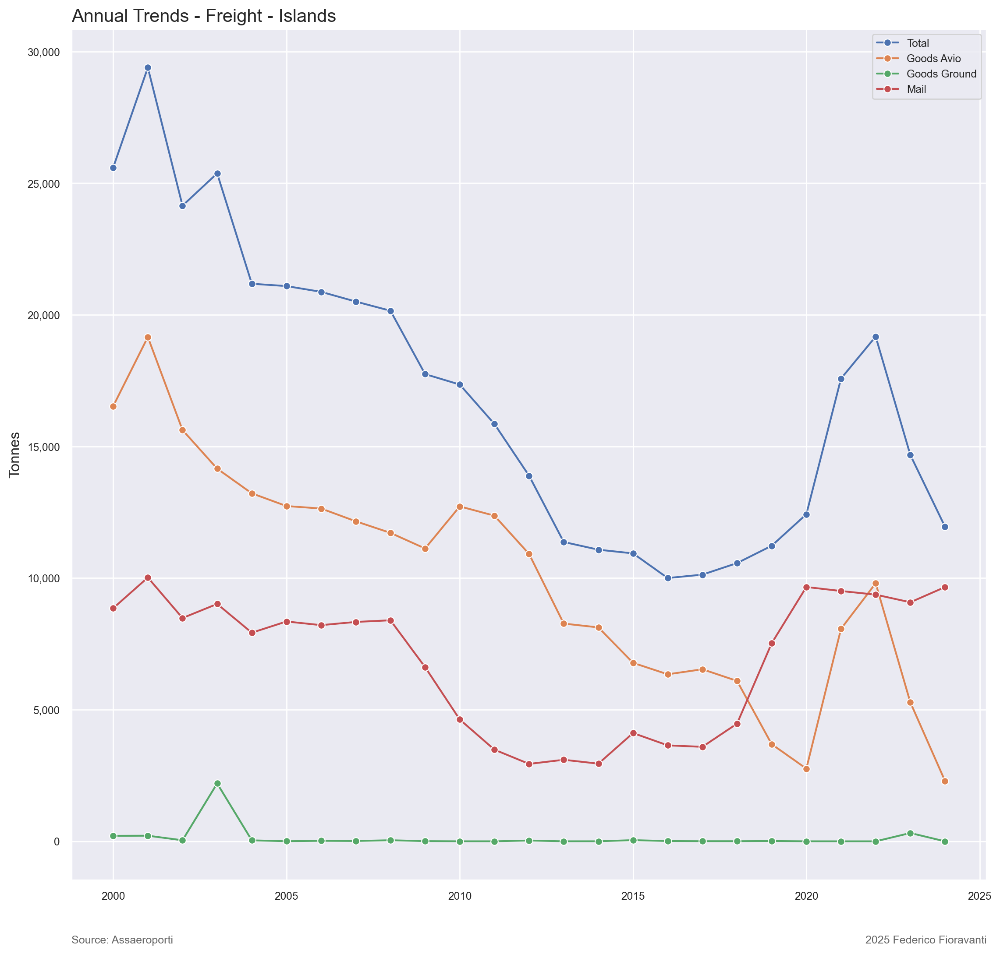

In [60]:
# plot the time series for Islands annual freight 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Freight - Islands', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=fre_tot_year_is, x='Year', y='FRE - Total', marker='o', label='Total')
sns.lineplot(data=fre_avio_year_is, x='Year', y='FRE - Goods Avio', marker='o', label='Goods Avio')
sns.lineplot(data=fre_grnd_year_is, x='Year', y='FRE - Goods Ground', marker='o', label='Goods Ground')
sns.lineplot(data=fre_mail_year_is, x='Year', y='FRE - Mail', marker='o', label='Mail')

ax.set(xlabel=None)

plt.legend(loc="upper right")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

In [41]:
# comments to be added




In [56]:
# define subsets for dimensional class
mov_tot_dim = df.groupby(['Year', 'Dimension'])['MOV - Total'].sum().reset_index()
pax_tot_dim = df.groupby(['Year', 'Dimension'])['PAX - Total'].sum().reset_index()
fre_tot_dim = df.groupby(['Year', 'Dimension'])['FRE - Total'].sum().reset_index()

In [57]:
# create colour mapping based on all unique values of dimensional class
dims = df['Dimension'].unique()
colours_dim = sns.color_palette('hsv', n_colors=len(dims))  # get a number of colours
cmap_dim = dict(zip(dims, colours_dim))  # zip values to colours

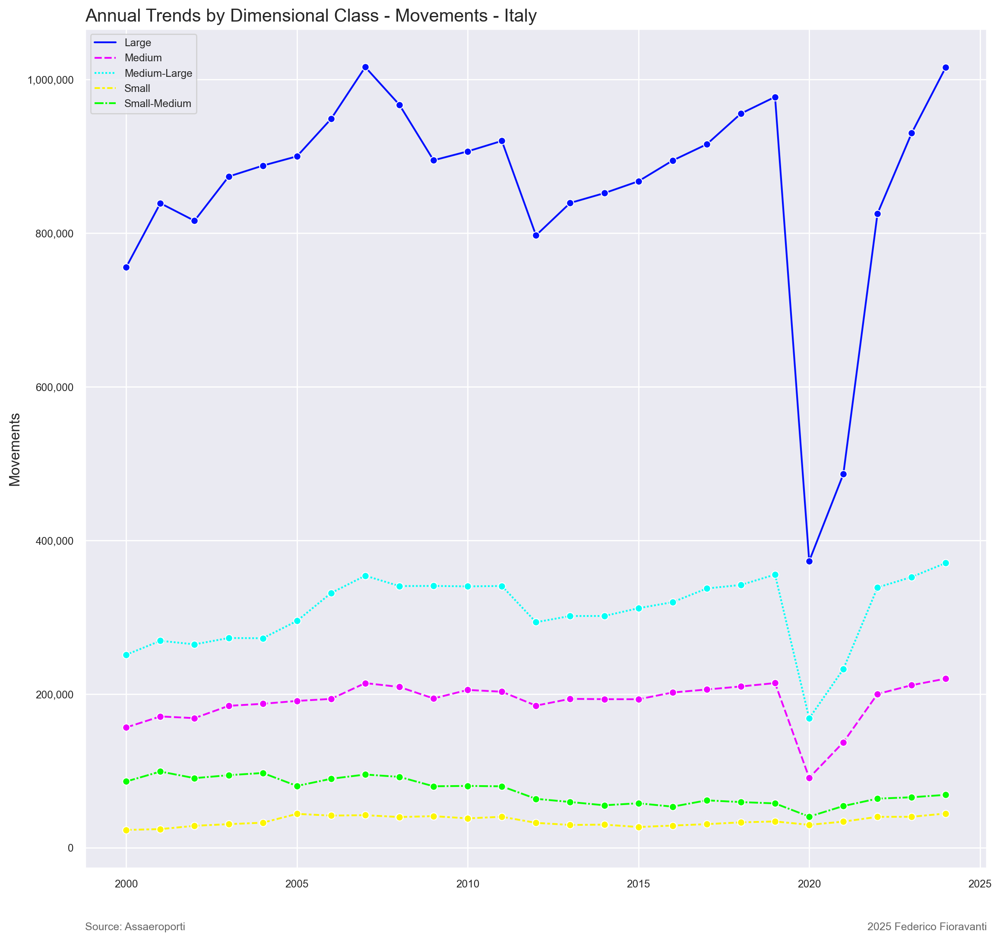

In [58]:
# plot the time series for annual movements by dimensional class
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Dimensional Class - Movements - Italy', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=mov_tot_dim, x='Year', y='MOV - Total', hue='Dimension', style='Dimension',
                 palette=cmap_dim, marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

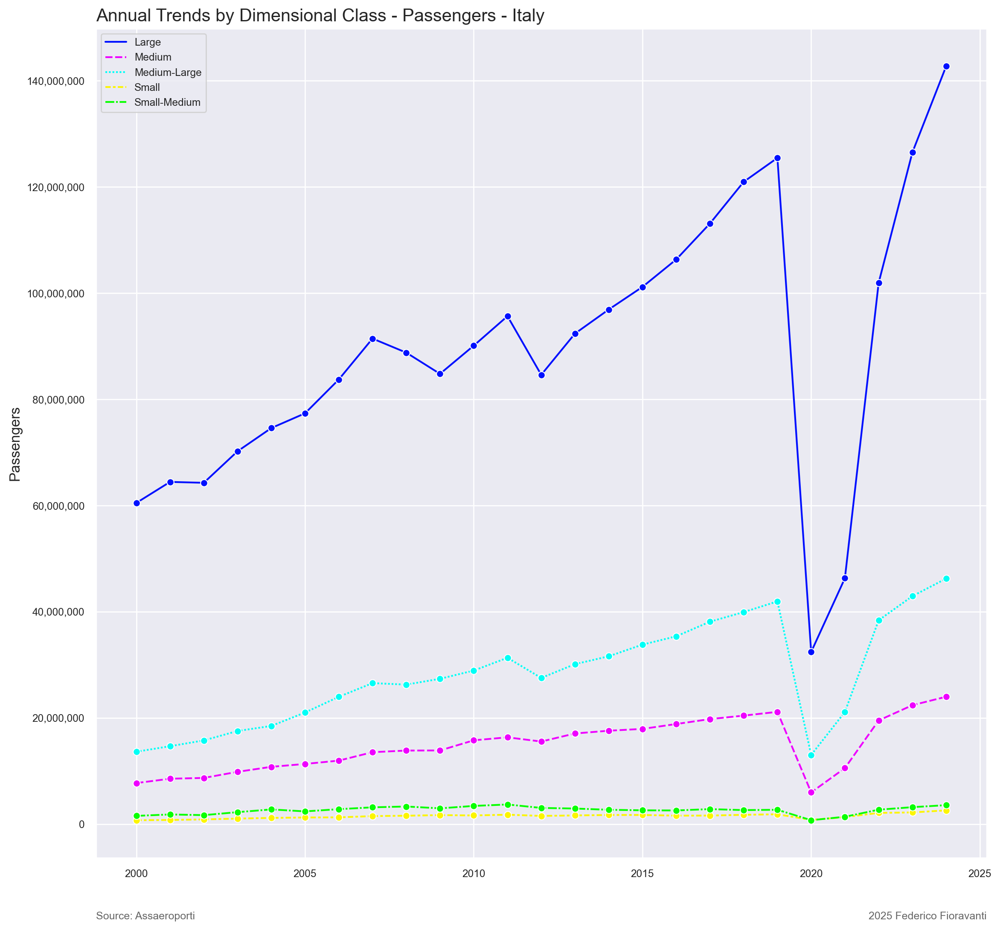

In [59]:
# plot the time series for annual passengers by dimensional class
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Dimensional Class - Passengers - Italy', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=pax_tot_dim, x='Year', y='PAX - Total', hue='Dimension', style='Dimension',
                 palette=cmap_dim, marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

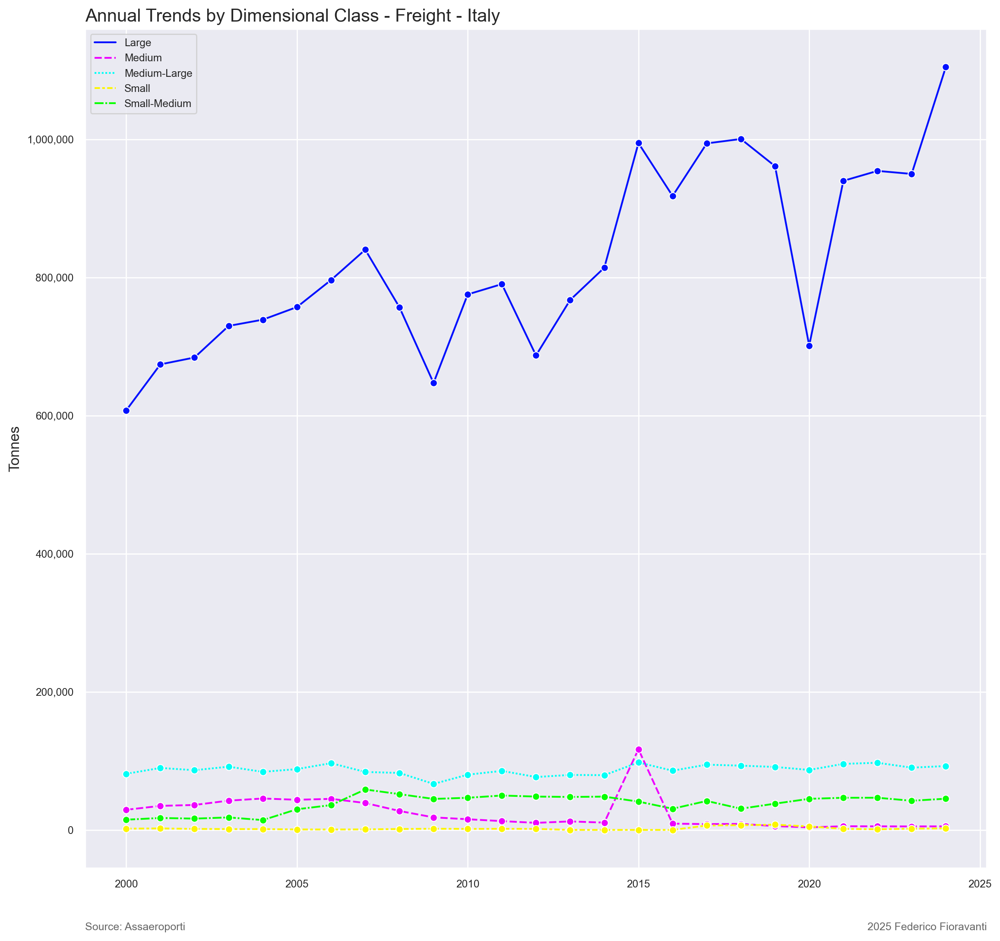

In [61]:
# plot the time series for annual freight by dimensional class
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Dimensional Class - Freight - Italy', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=fre_tot_dim, x='Year', y='FRE - Total', hue='Dimension', style='Dimension',
                 palette=cmap_dim, marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

In [47]:
# comments to be added




In [62]:
# define subsets for regional annual aircraft movements by airport 
mov_dom_airp_nw = df_nw.groupby(['Year', 'Airport'])['MOV - Domestic'].sum().reset_index()
mov_dom_airp_ne = df_ne.groupby(['Year', 'Airport'])['MOV - Domestic'].sum().reset_index()
mov_dom_airp_cw = df_cw.groupby(['Year', 'Airport'])['MOV - Domestic'].sum().reset_index()
mov_dom_airp_ce = df_ce.groupby(['Year', 'Airport'])['MOV - Domestic'].sum().reset_index()
mov_dom_airp_so = df_so.groupby(['Year', 'Airport'])['MOV - Domestic'].sum().reset_index()
mov_dom_airp_is = df_is.groupby(['Year', 'Airport'])['MOV - Domestic'].sum().reset_index()
mov_int_airp_nw = df_nw.groupby(['Year', 'Airport'])['MOV - International'].sum().reset_index()
mov_int_airp_ne = df_ne.groupby(['Year', 'Airport'])['MOV - International'].sum().reset_index()
mov_int_airp_cw = df_cw.groupby(['Year', 'Airport'])['MOV - International'].sum().reset_index()
mov_int_airp_ce = df_ce.groupby(['Year', 'Airport'])['MOV - International'].sum().reset_index()
mov_int_airp_so = df_so.groupby(['Year', 'Airport'])['MOV - International'].sum().reset_index()
mov_int_airp_is = df_is.groupby(['Year', 'Airport'])['MOV - International'].sum().reset_index()
mov_EU_airp_nw = df_nw.groupby(['Year', 'Airport'])['MOV - EU'].sum().reset_index()
mov_EU_airp_ne = df_ne.groupby(['Year', 'Airport'])['MOV - EU'].sum().reset_index()
mov_EU_airp_cw = df_cw.groupby(['Year', 'Airport'])['MOV - EU'].sum().reset_index()
mov_EU_airp_ce = df_ce.groupby(['Year', 'Airport'])['MOV - EU'].sum().reset_index()
mov_EU_airp_so = df_so.groupby(['Year', 'Airport'])['MOV - EU'].sum().reset_index()
mov_EU_airp_is = df_is.groupby(['Year', 'Airport'])['MOV - EU'].sum().reset_index()
mov_gen_airp_nw = df_nw.groupby(['Year', 'Airport'])['MOV - General Avio'].sum().reset_index()
mov_gen_airp_ne = df_ne.groupby(['Year', 'Airport'])['MOV - General Avio'].sum().reset_index()
mov_gen_airp_cw = df_cw.groupby(['Year', 'Airport'])['MOV - General Avio'].sum().reset_index()
mov_gen_airp_ce = df_ce.groupby(['Year', 'Airport'])['MOV - General Avio'].sum().reset_index()
mov_gen_airp_so = df_so.groupby(['Year', 'Airport'])['MOV - General Avio'].sum().reset_index()
mov_gen_airp_is = df_is.groupby(['Year', 'Airport'])['MOV - General Avio'].sum().reset_index()
mov_tot_airp_nw = df_nw.groupby(['Year', 'Airport'])['MOV - Total'].sum().reset_index()
mov_tot_airp_ne = df_ne.groupby(['Year', 'Airport'])['MOV - Total'].sum().reset_index()
mov_tot_airp_cw = df_cw.groupby(['Year', 'Airport'])['MOV - Total'].sum().reset_index()
mov_tot_airp_ce = df_ce.groupby(['Year', 'Airport'])['MOV - Total'].sum().reset_index()
mov_tot_airp_so = df_so.groupby(['Year', 'Airport'])['MOV - Total'].sum().reset_index()
mov_tot_airp_is = df_is.groupby(['Year', 'Airport'])['MOV - Total'].sum().reset_index()

# define subsets for regional annual passengers by airport 
pax_dom_airp_nw = df_nw.groupby(['Year', 'Airport'])['PAX - Domestic'].sum().reset_index()
pax_dom_airp_ne = df_ne.groupby(['Year', 'Airport'])['PAX - Domestic'].sum().reset_index()
pax_dom_airp_cw = df_cw.groupby(['Year', 'Airport'])['PAX - Domestic'].sum().reset_index()
pax_dom_airp_ce = df_ce.groupby(['Year', 'Airport'])['PAX - Domestic'].sum().reset_index()
pax_dom_airp_so = df_so.groupby(['Year', 'Airport'])['PAX - Domestic'].sum().reset_index()
pax_dom_airp_is = df_is.groupby(['Year', 'Airport'])['PAX - Domestic'].sum().reset_index()
pax_int_airp_nw = df_nw.groupby(['Year', 'Airport'])['PAX - International'].sum().reset_index()
pax_int_airp_ne = df_ne.groupby(['Year', 'Airport'])['PAX - International'].sum().reset_index()
pax_int_airp_cw = df_cw.groupby(['Year', 'Airport'])['PAX - International'].sum().reset_index()
pax_int_airp_ce = df_ce.groupby(['Year', 'Airport'])['PAX - International'].sum().reset_index()
pax_int_airp_so = df_so.groupby(['Year', 'Airport'])['PAX - International'].sum().reset_index()
pax_int_airp_is = df_is.groupby(['Year', 'Airport'])['PAX - International'].sum().reset_index()
pax_EU_airp_nw = df_nw.groupby(['Year', 'Airport'])['PAX - EU'].sum().reset_index()
pax_EU_airp_ne = df_ne.groupby(['Year', 'Airport'])['PAX - EU'].sum().reset_index()
pax_EU_airp_cw = df_cw.groupby(['Year', 'Airport'])['PAX - EU'].sum().reset_index()
pax_EU_airp_ce = df_ce.groupby(['Year', 'Airport'])['PAX - EU'].sum().reset_index()
pax_EU_airp_so = df_so.groupby(['Year', 'Airport'])['PAX - EU'].sum().reset_index()
pax_EU_airp_is = df_is.groupby(['Year', 'Airport'])['PAX - EU'].sum().reset_index()
pax_trs_airp_nw = df_nw.groupby(['Year', 'Airport'])['PAX - Transit'].sum().reset_index()
pax_trs_airp_ne = df_ne.groupby(['Year', 'Airport'])['PAX - Transit'].sum().reset_index()
pax_trs_airp_cw = df_cw.groupby(['Year', 'Airport'])['PAX - Transit'].sum().reset_index()
pax_trs_airp_ce = df_ce.groupby(['Year', 'Airport'])['PAX - Transit'].sum().reset_index()
pax_trs_airp_so = df_so.groupby(['Year', 'Airport'])['PAX - Transit'].sum().reset_index()
pax_trs_airp_is = df_is.groupby(['Year', 'Airport'])['PAX - Transit'].sum().reset_index()
pax_gen_airp_nw = df_nw.groupby(['Year', 'Airport'])['PAX - General Avio'].sum().reset_index()
pax_gen_airp_ne = df_ne.groupby(['Year', 'Airport'])['PAX - General Avio'].sum().reset_index()
pax_gen_airp_cw = df_cw.groupby(['Year', 'Airport'])['PAX - General Avio'].sum().reset_index()
pax_gen_airp_ce = df_ce.groupby(['Year', 'Airport'])['PAX - General Avio'].sum().reset_index()
pax_gen_airp_so = df_so.groupby(['Year', 'Airport'])['PAX - General Avio'].sum().reset_index()
pax_gen_airp_is = df_is.groupby(['Year', 'Airport'])['PAX - General Avio'].sum().reset_index()
pax_tot_airp_nw = df_nw.groupby(['Year', 'Airport'])['PAX - Total'].sum().reset_index()
pax_tot_airp_ne = df_ne.groupby(['Year', 'Airport'])['PAX - Total'].sum().reset_index()
pax_tot_airp_cw = df_cw.groupby(['Year', 'Airport'])['PAX - Total'].sum().reset_index()
pax_tot_airp_ce = df_ce.groupby(['Year', 'Airport'])['PAX - Total'].sum().reset_index()
pax_tot_airp_so = df_so.groupby(['Year', 'Airport'])['PAX - Total'].sum().reset_index()
pax_tot_airp_is = df_is.groupby(['Year', 'Airport'])['PAX - Total'].sum().reset_index()

# define subsets for regional annual freight by airport
fre_tot_airp_nw = df_nw.groupby(['Year', 'Airport'])['FRE - Total'].sum().reset_index()
fre_tot_airp_ne = df_ne.groupby(['Year', 'Airport'])['FRE - Total'].sum().reset_index()
fre_tot_airp_cw = df_cw.groupby(['Year', 'Airport'])['FRE - Total'].sum().reset_index()
fre_tot_airp_ce = df_ce.groupby(['Year', 'Airport'])['FRE - Total'].sum().reset_index()
fre_tot_airp_so = df_so.groupby(['Year', 'Airport'])['FRE - Total'].sum().reset_index()
fre_tot_airp_is = df_is.groupby(['Year', 'Airport'])['FRE - Total'].sum().reset_index()




















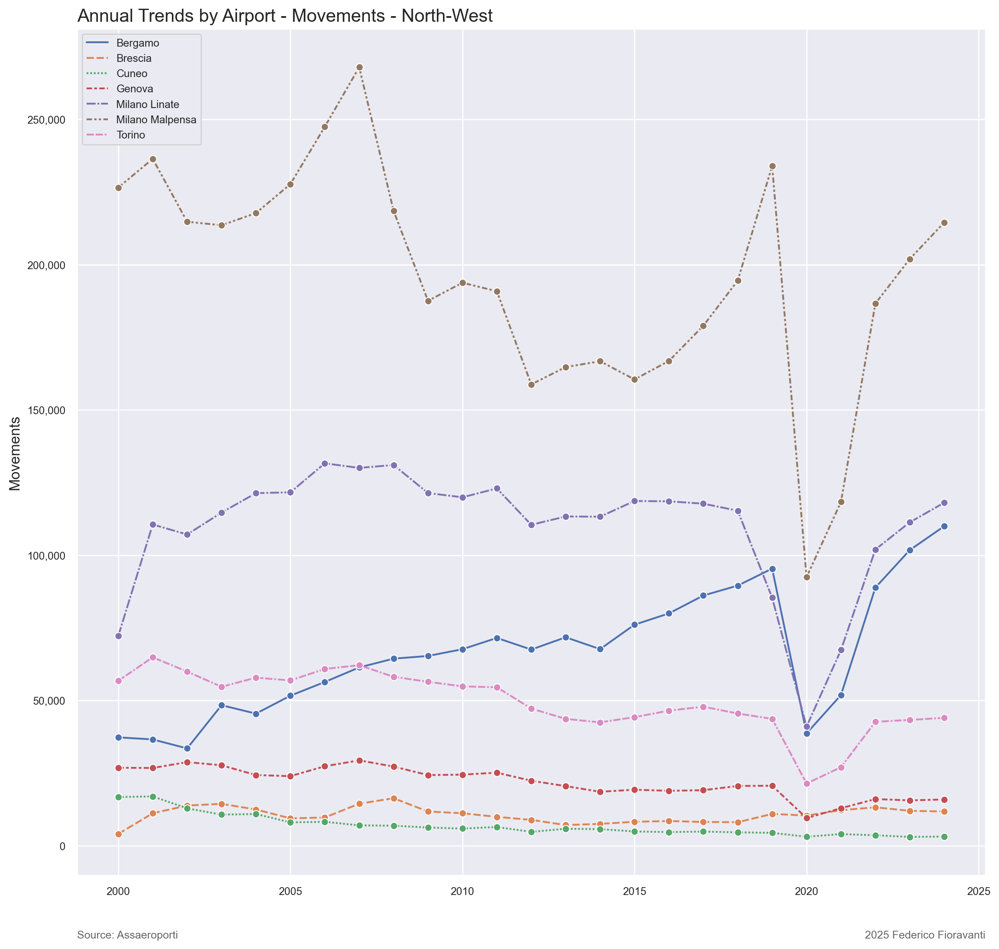

In [63]:
# plot the time series for North-West annual movements by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Movements - North-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=mov_tot_airp_nw, x='Year', y='MOV - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

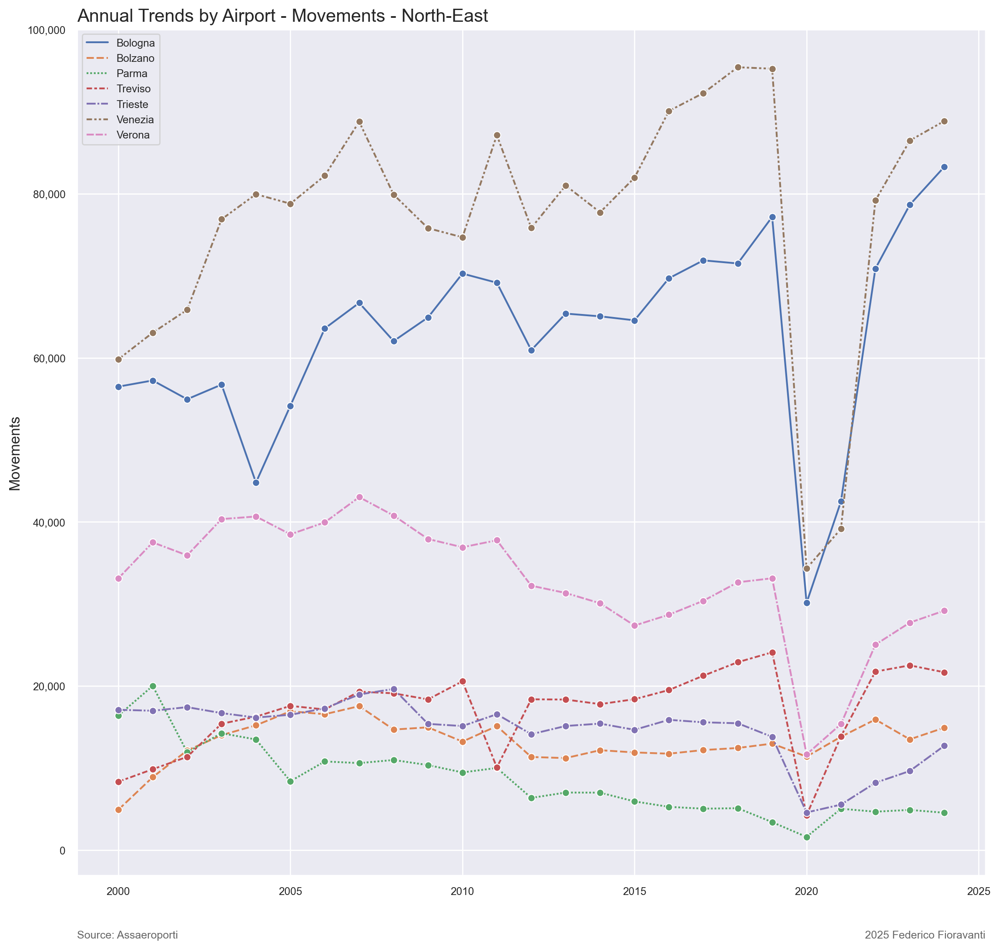

In [64]:
# plot the time series for North-East annual movements by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Movements - North-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=mov_tot_airp_ne, x='Year', y='MOV - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

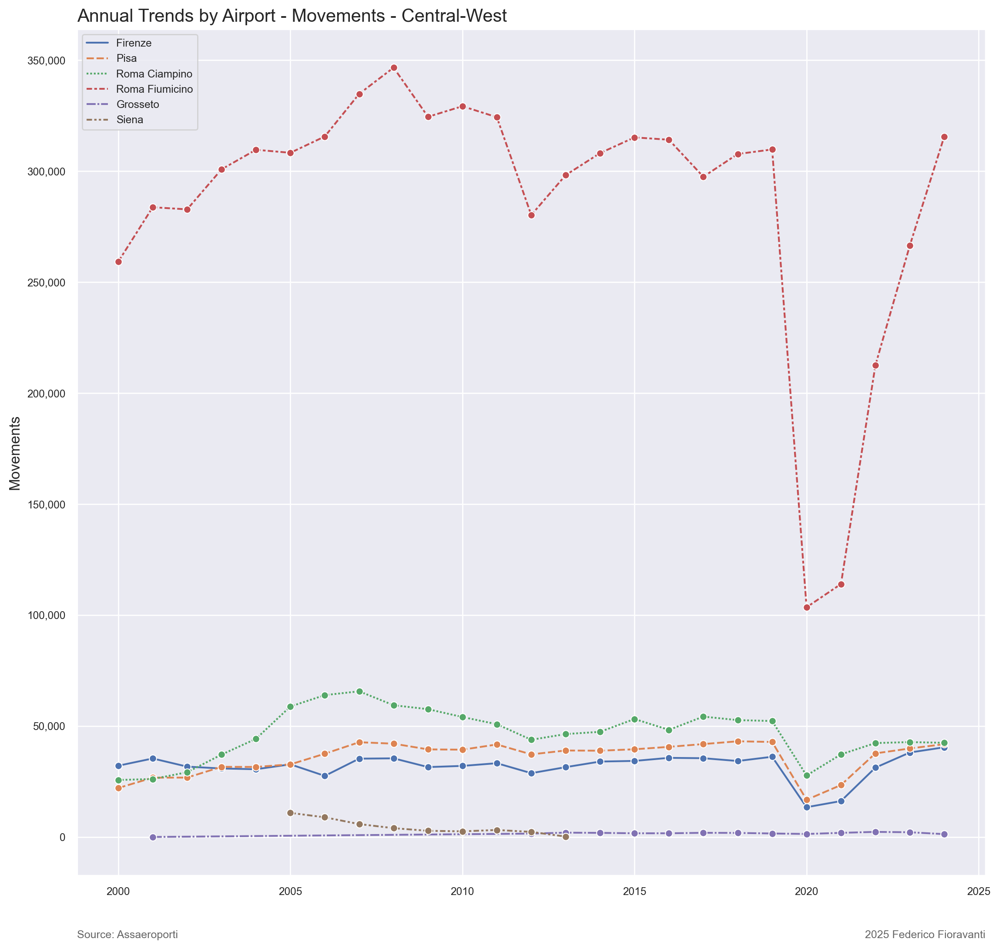

In [65]:
# plot the time series for Central-West annual movements by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Movements - Central-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=mov_tot_airp_cw, x='Year', y='MOV - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

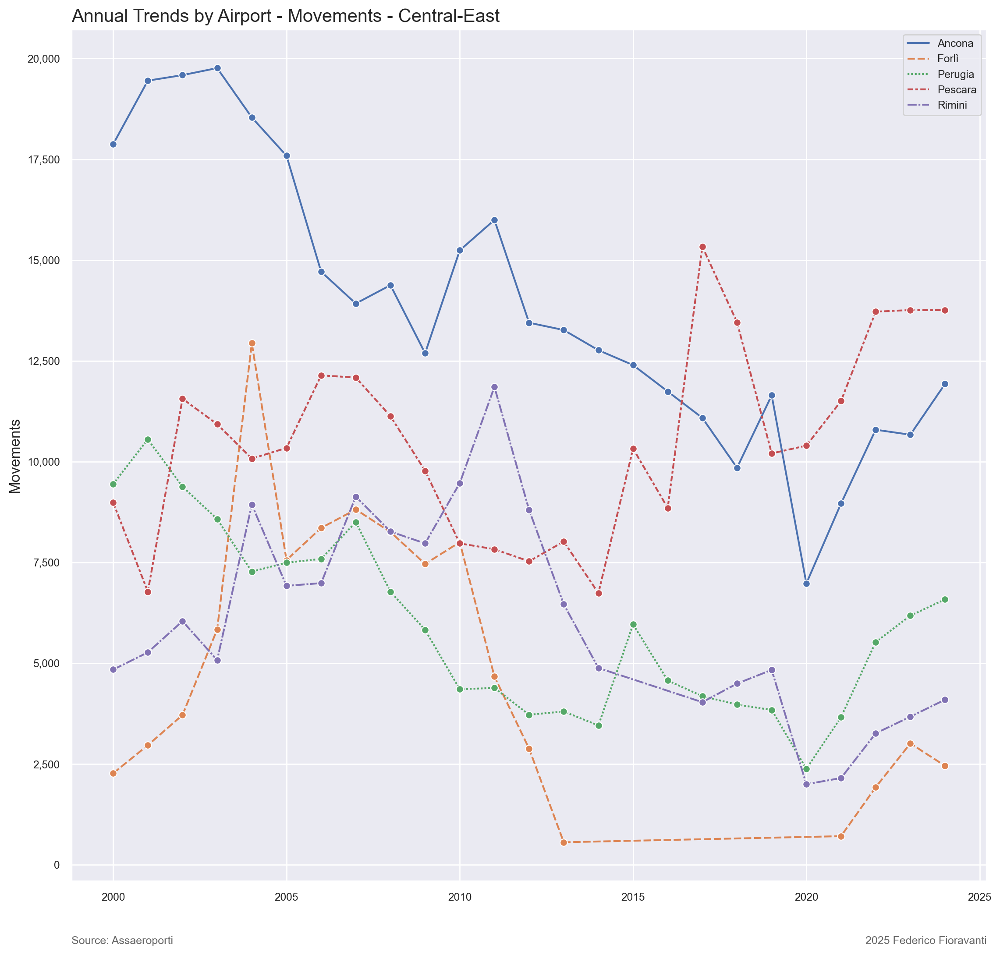

In [66]:
# plot the time series for Central-East annual movements by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Movements - Central-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=mov_tot_airp_ce, x='Year', y='MOV - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper right")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

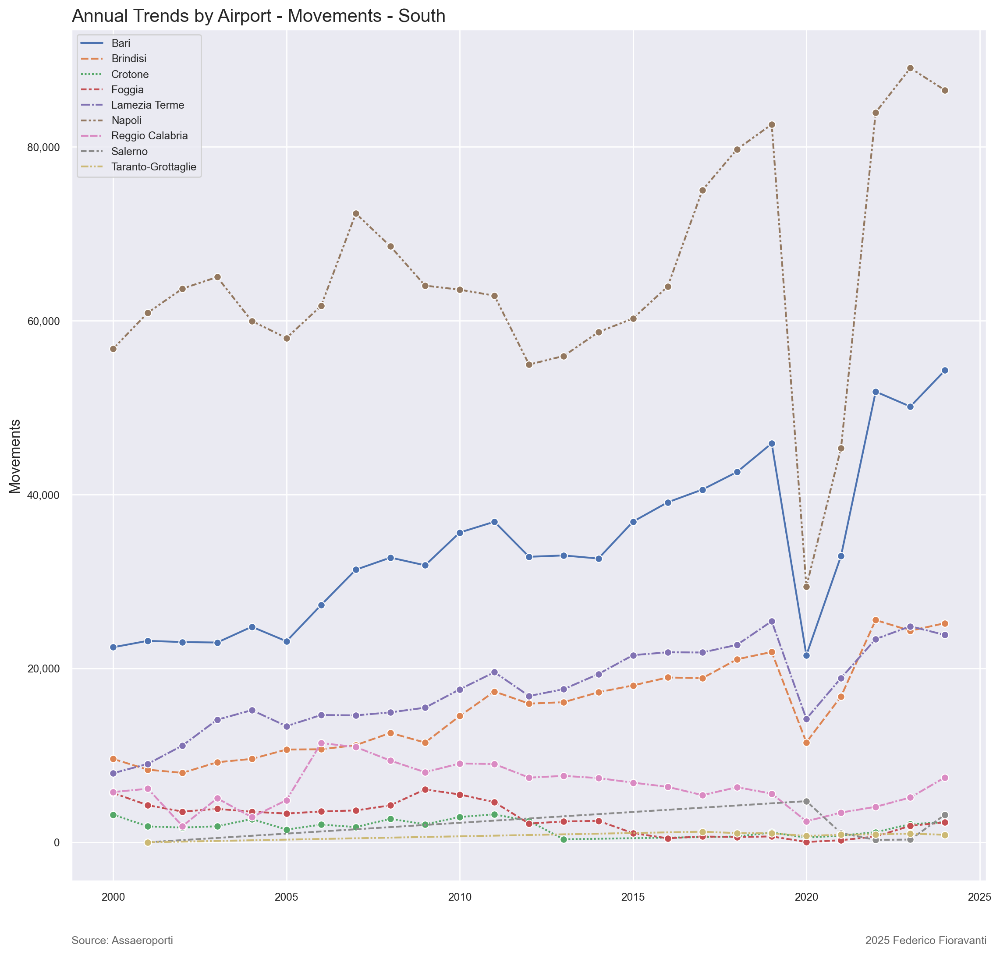

In [67]:
# plot the time series for South annual movements by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Movements - South', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=mov_tot_airp_so, x='Year', y='MOV - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

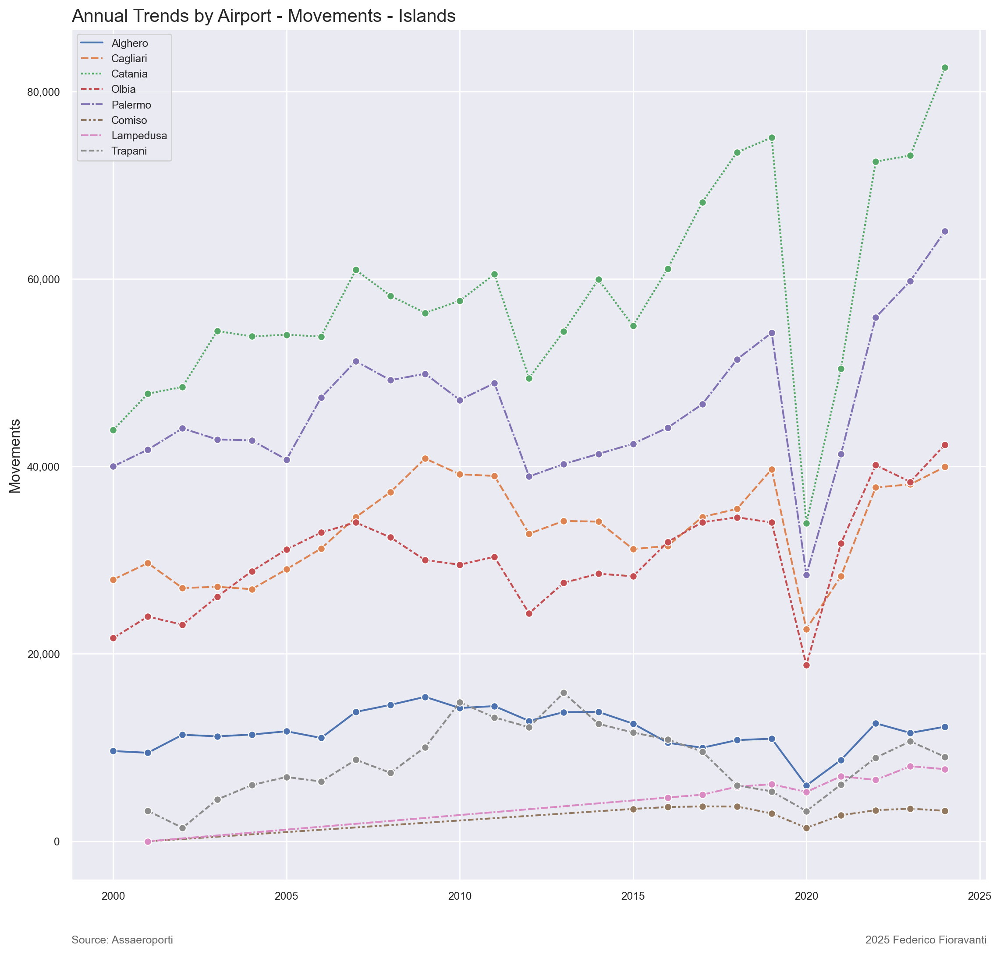

In [68]:
# plot the time series for Islands annual movements by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Movements - Islands', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Movements', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=mov_tot_airp_is, x='Year', y='MOV - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

In [55]:
# comments to be added




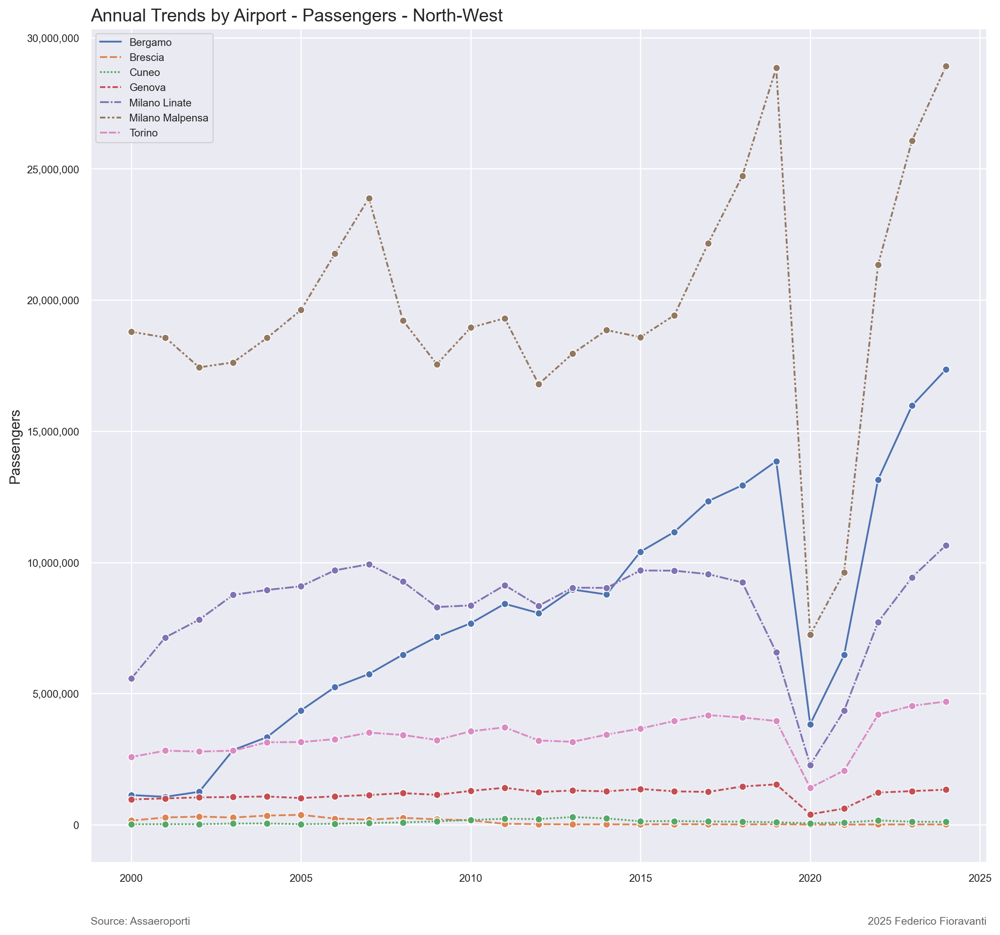

In [69]:
# plot the time series for North-West annual passengers by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Passengers - North-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=pax_tot_airp_nw, x='Year', y='PAX - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

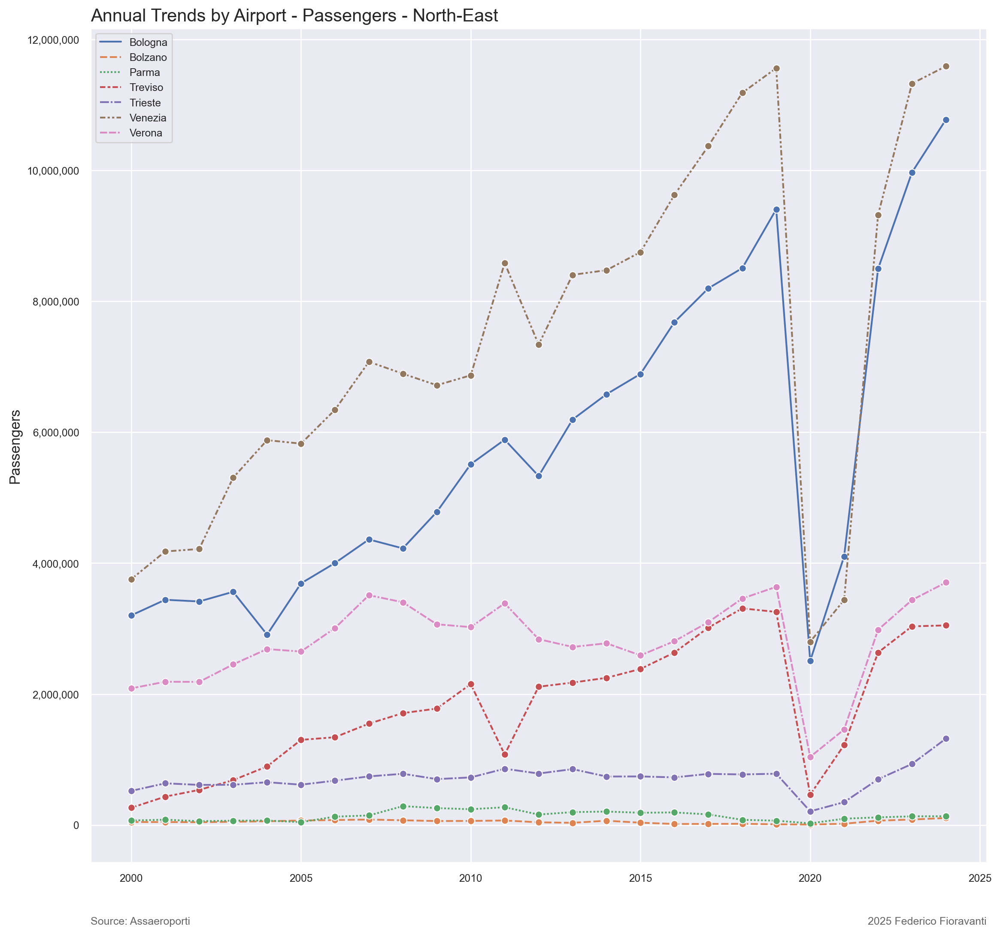

In [70]:
# plot the time series for North-East annual passengers by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Passengers - North-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=pax_tot_airp_ne, x='Year', y='PAX - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

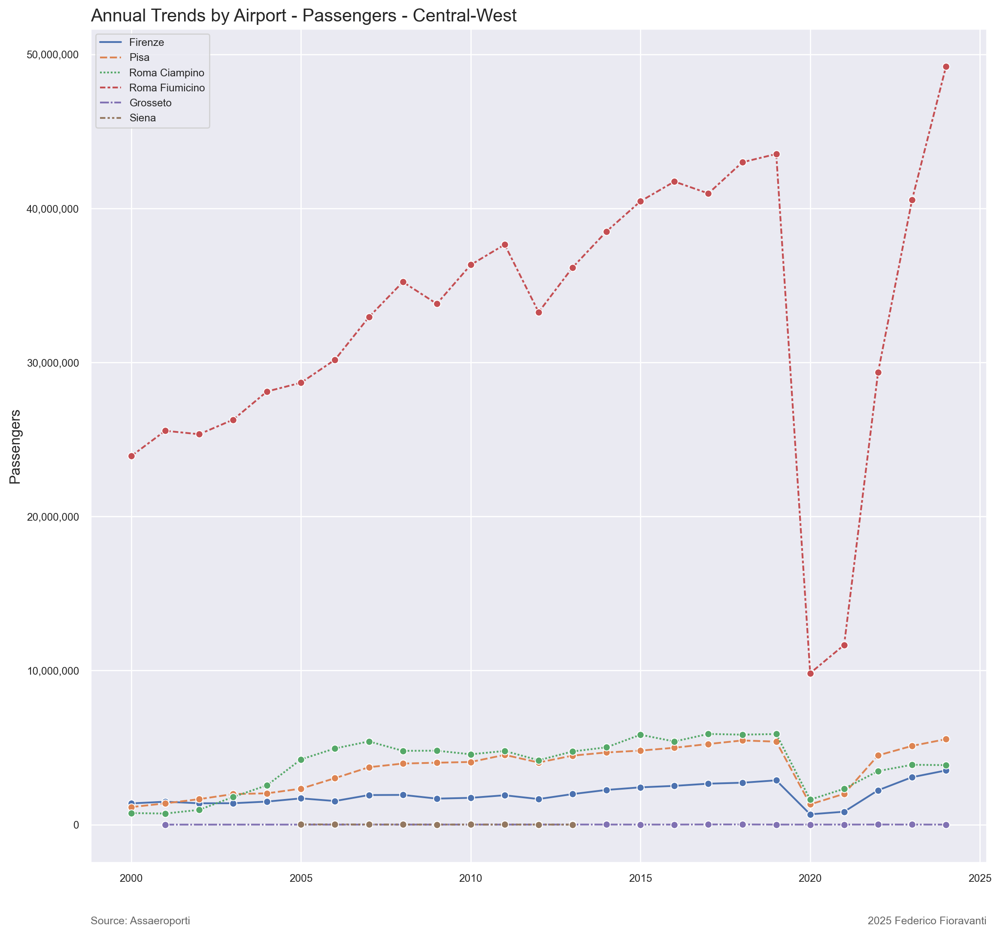

In [71]:
# plot the time series for Central-West annual passengers by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Passengers - Central-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=pax_tot_airp_cw, x='Year', y='PAX - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

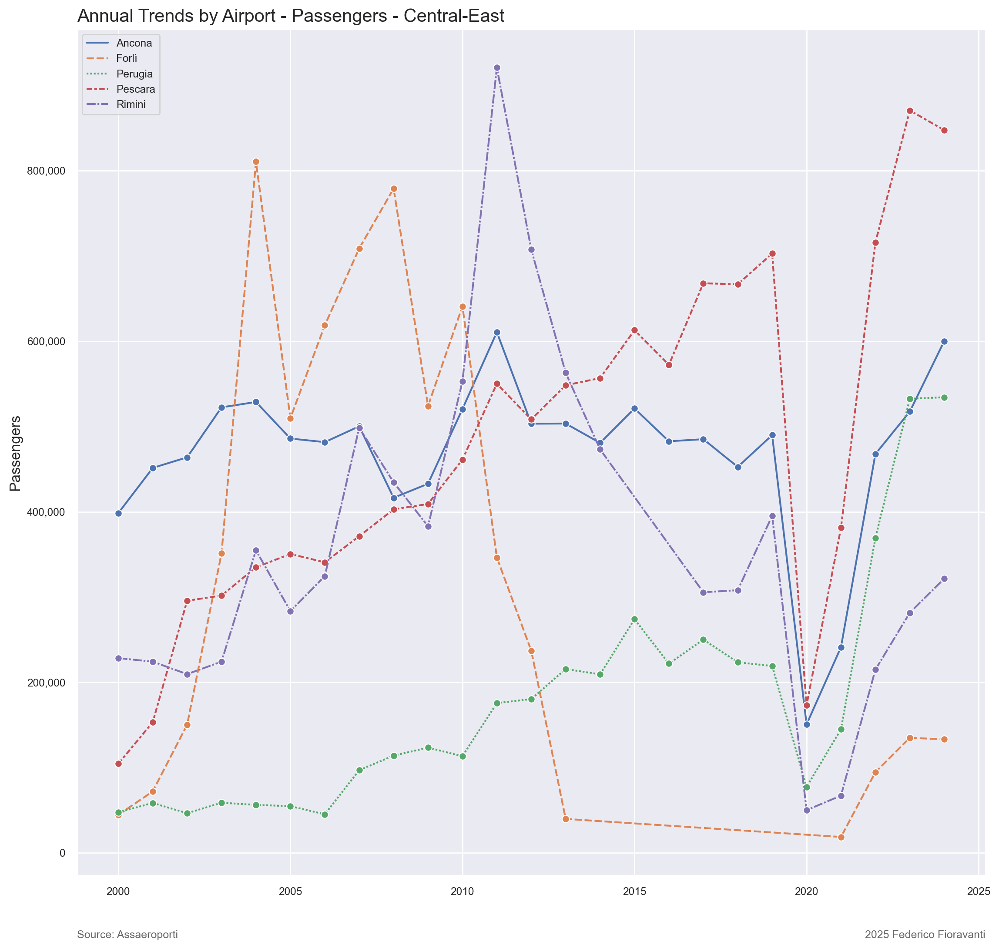

In [72]:
# plot the time series for Central-East annual passengers by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Passengers - Central-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=pax_tot_airp_ce, x='Year', y='PAX - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

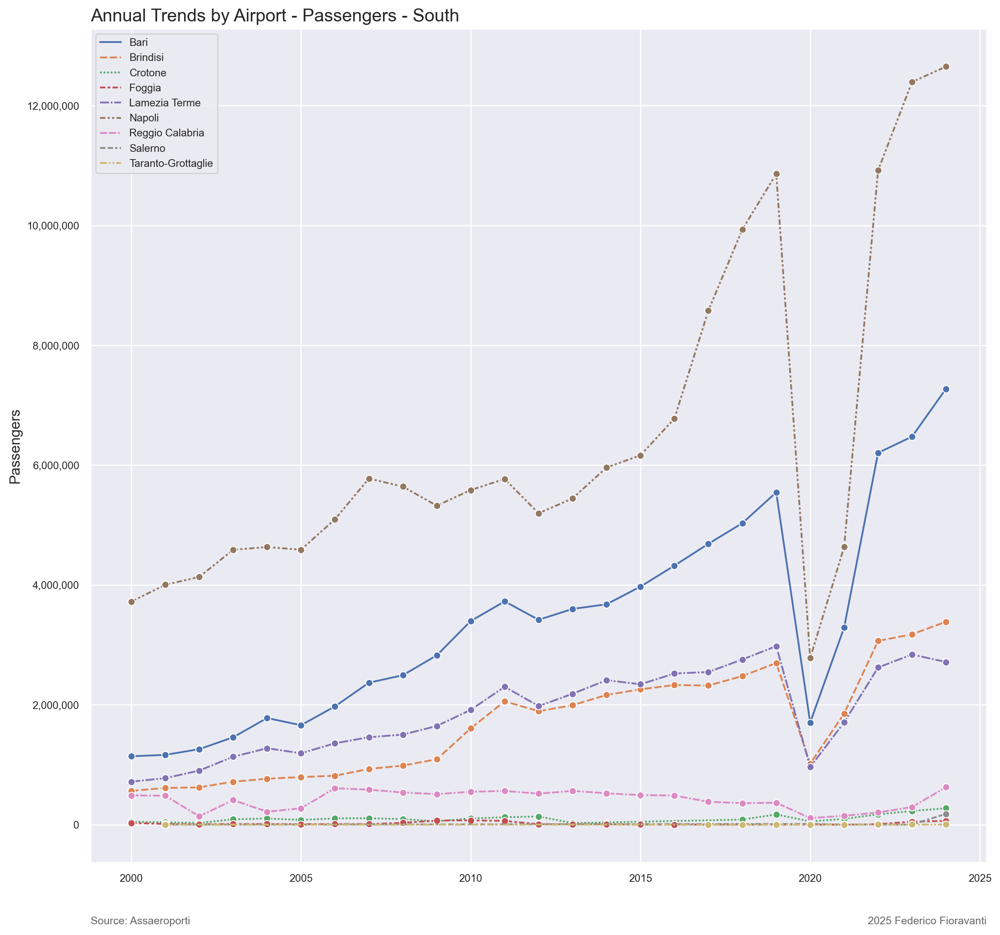

In [73]:
# plot the time series for South annual passengers by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Passengers - South', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=pax_tot_airp_so, x='Year', y='PAX - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

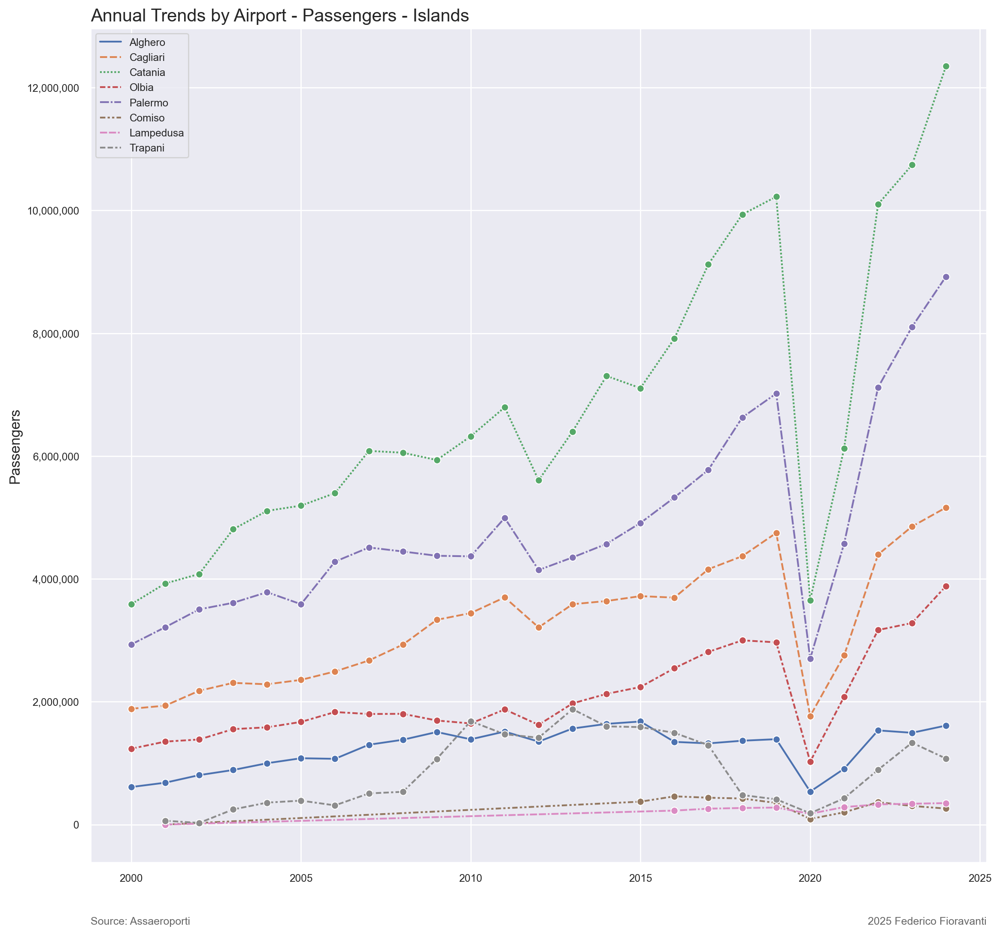

In [74]:
# plot the time series for Islands annual passengers by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Passengers - Islands', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=pax_tot_airp_is, x='Year', y='PAX - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

In [62]:
# comments to be added




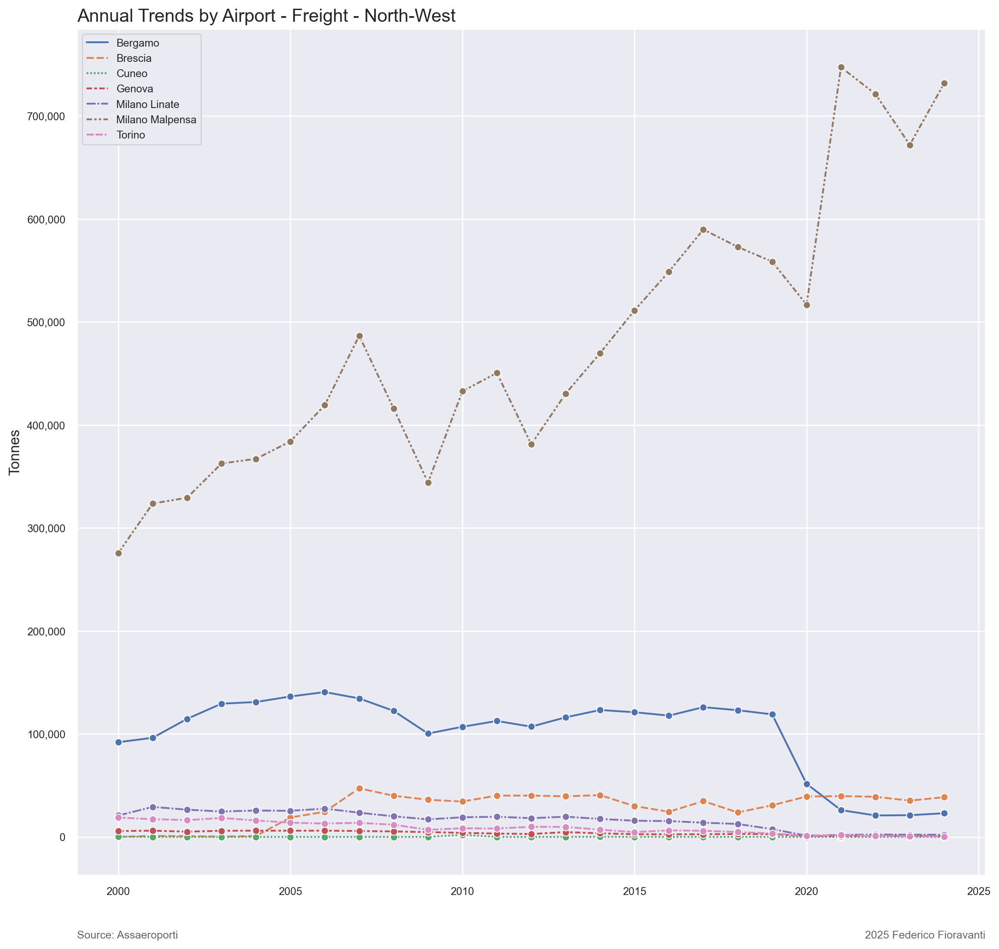

In [75]:
# plot the time series for North-West annual freight by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Freight - North-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=fre_tot_airp_nw, x='Year', y='FRE - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

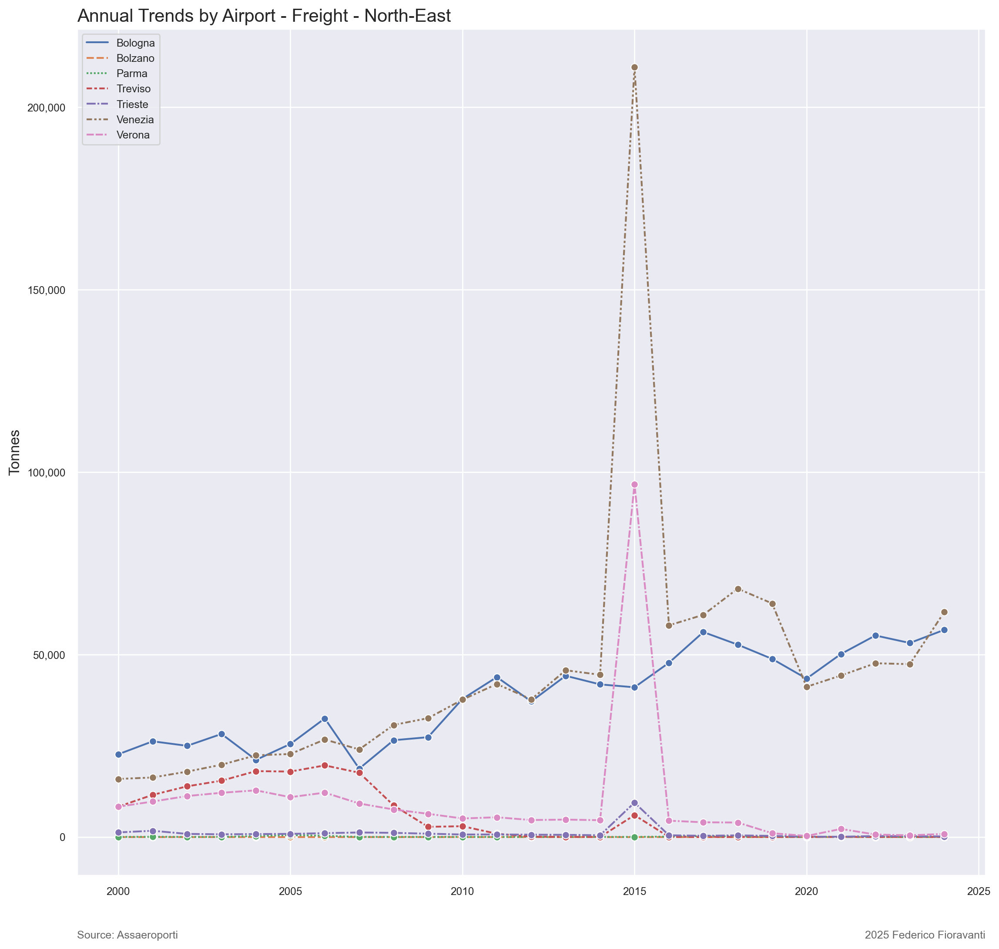

In [76]:
# plot the time series for North-East annual freight by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Freight - North-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=fre_tot_airp_ne, x='Year', y='FRE - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

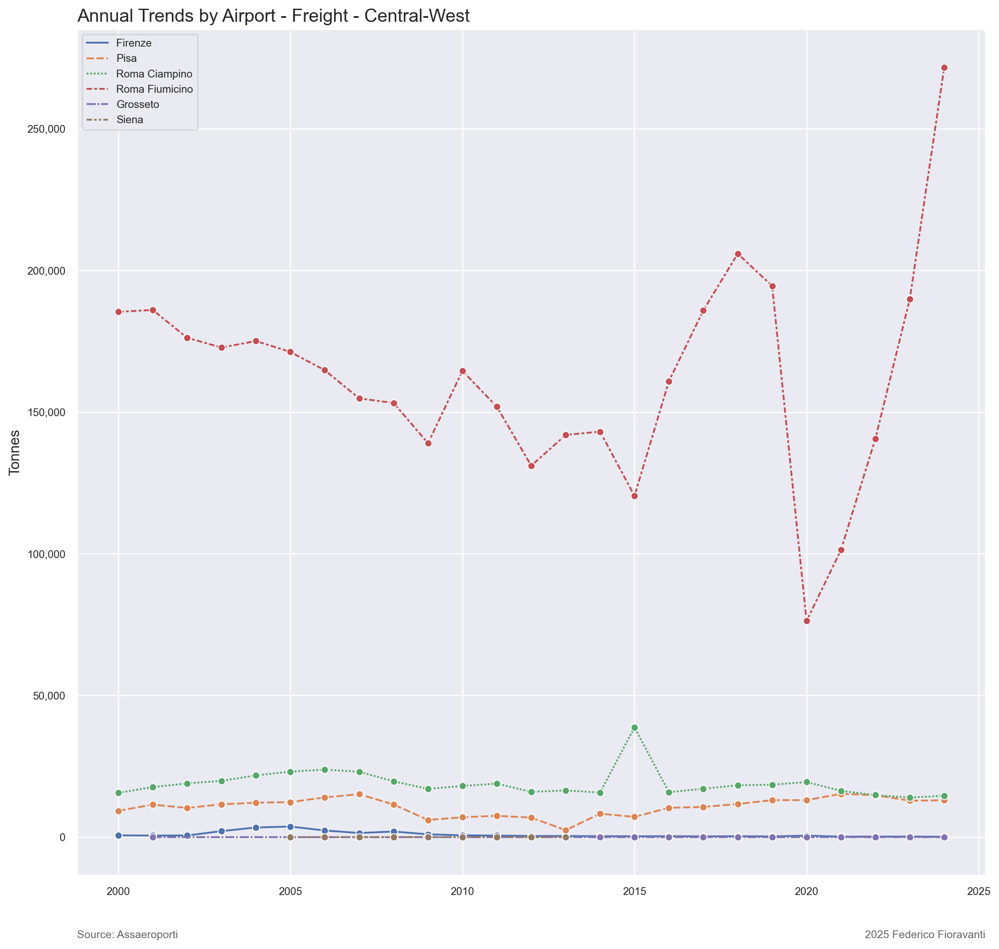

In [77]:
# plot the time series for Central-West annual freight by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Freight - Central-West', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=fre_tot_airp_cw, x='Year', y='FRE - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

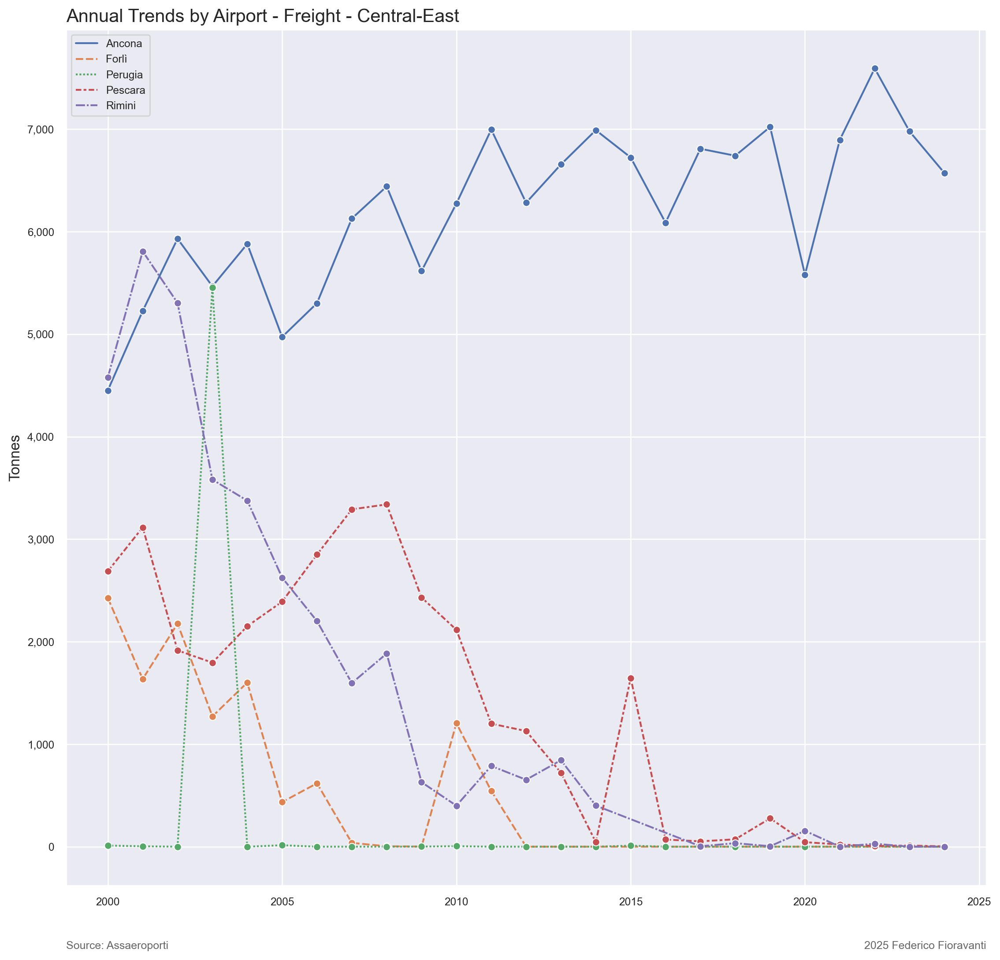

In [78]:
# plot the time series for Central-East annual freight by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Freight - Central-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=fre_tot_airp_ce, x='Year', y='FRE - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

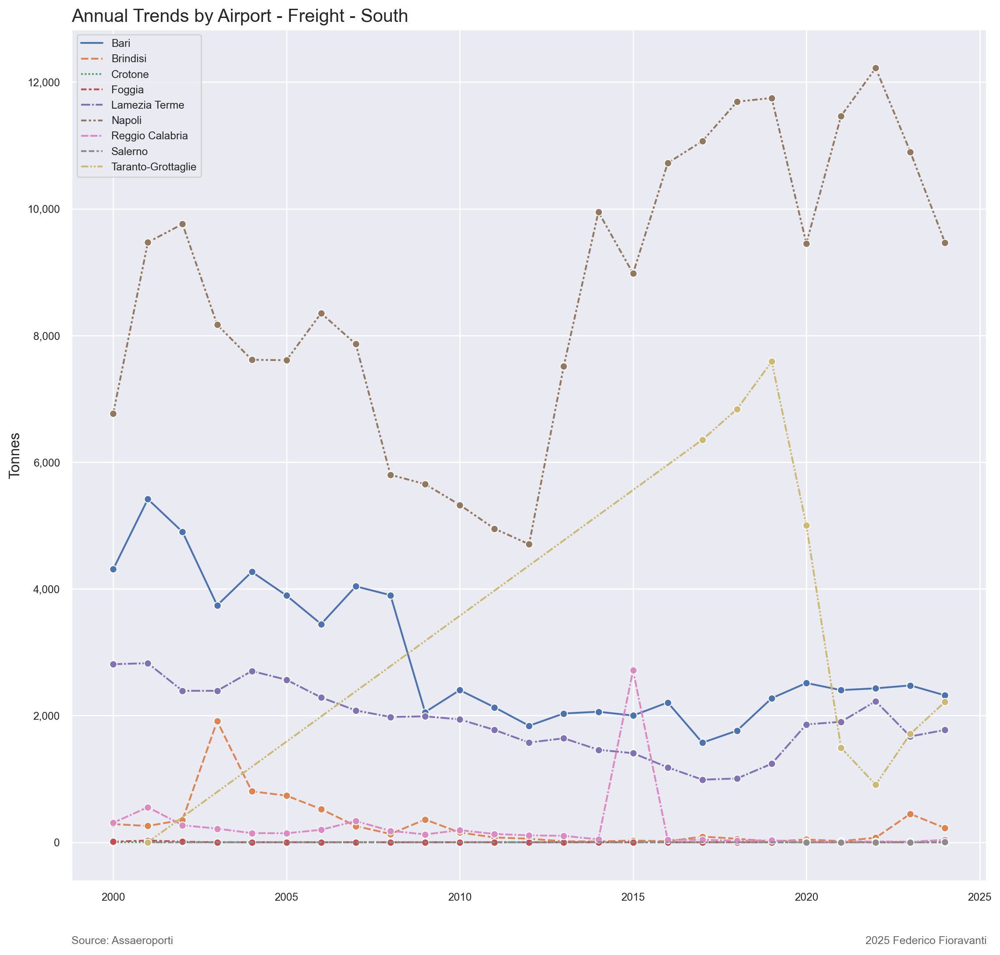

In [79]:
# plot the time series for South annual freight by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Freight - South', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=fre_tot_airp_so, x='Year', y='FRE - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

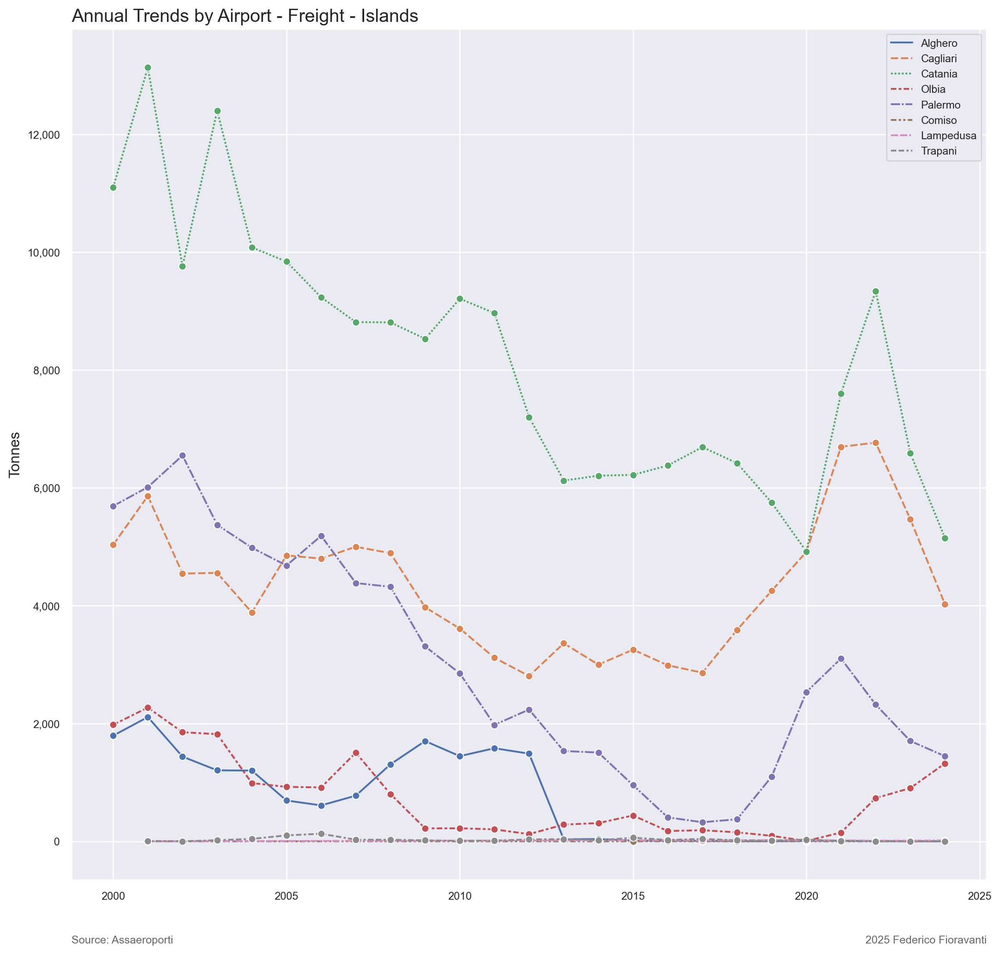

In [80]:
# plot the time series for Islands annual freight by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Freight - Islands', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Tonnes', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

p = sns.lineplot(data=fre_tot_airp_is, x='Year', y='FRE - Total', hue='Airport', style='Airport',
                 marker='o', ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper right")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

In [69]:
# comments to be added




In [ ]:
# define subsets by dimensional class
df_sml = df[df['Dimension'] == 'Small']
df_sme = df[df['Dimension'] == 'Small-Medium']
df_med = df[df['Dimension'] == 'Small']
df_mla = df[df['Dimension'] == 'Medium-Large']
df_lrg = df[df['Dimension'] == 'Large']

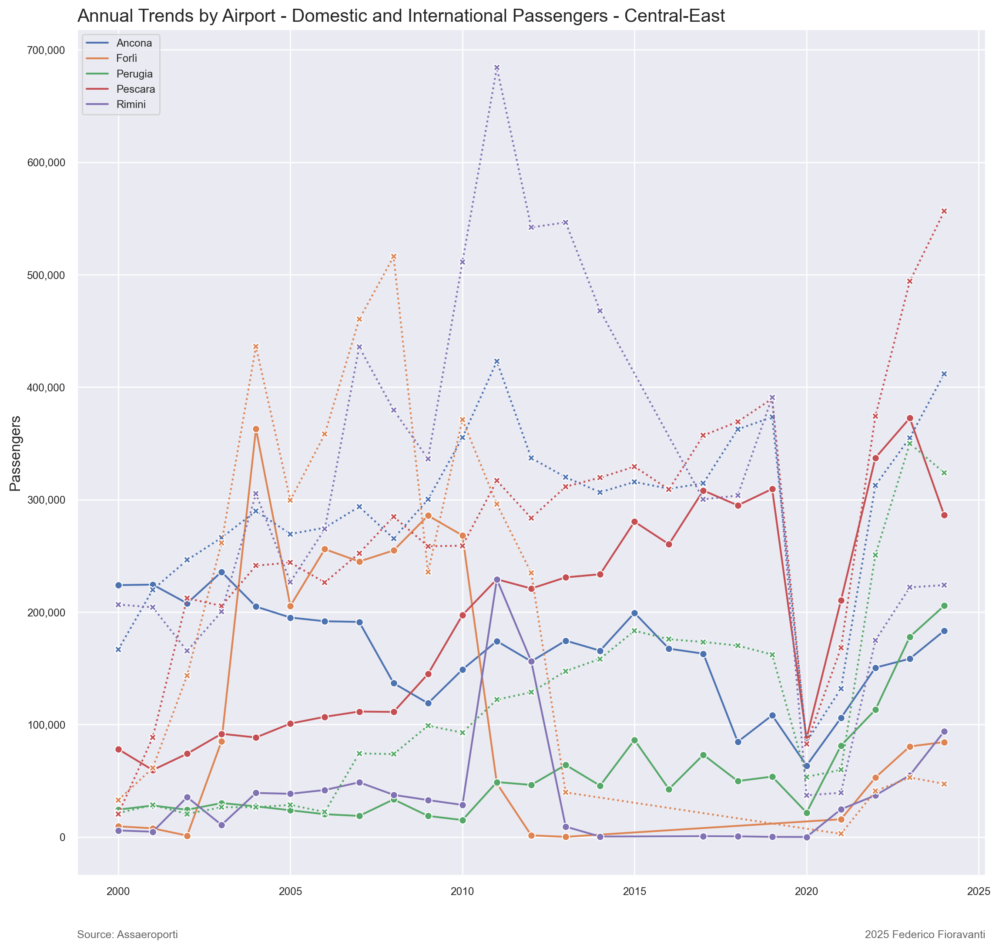

In [81]:
# plot the time series for Central-East annual passengers by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends by Airport - Domestic and International Passengers - Central-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=pax_dom_airp_ce, x='Year', y='PAX - Domestic', hue='Airport', linestyle='-', marker='o', ax=ax)
sns.lineplot(data=pax_int_airp_ce, x='Year', y='PAX - International', hue='Airport', linestyle=':', marker='X',
             legend=False, ax=ax)

ax.set(xlabel=None)

plt.legend(loc="upper left")

# set source text
ax.text(x=0.08, y=0.01, s="""Source: Assaeroporti""", transform=fig.transFigure, ha='left', fontsize=9, alpha=.7)
ax.text(x=0.95, y=0.01, s="""2025 Federico Fioravanti""", transform=fig.transFigure, ha='right', fontsize=9, alpha=.7)

plt.show()

In [69]:
# define subsets by airport
df_AOI = df[df['Airport'] == 'Ancona']
df_FRL = df[df['Airport'] == 'Forlì']
df_PEG = df[df['Airport'] == 'Perugia']
df_PSR = df[df['Airport'] == 'Pescara']
df_RMI = df[df['Airport'] == 'Rimini']

ValueError: Could not interpret value `PAX - Ancona` for parameter `y`

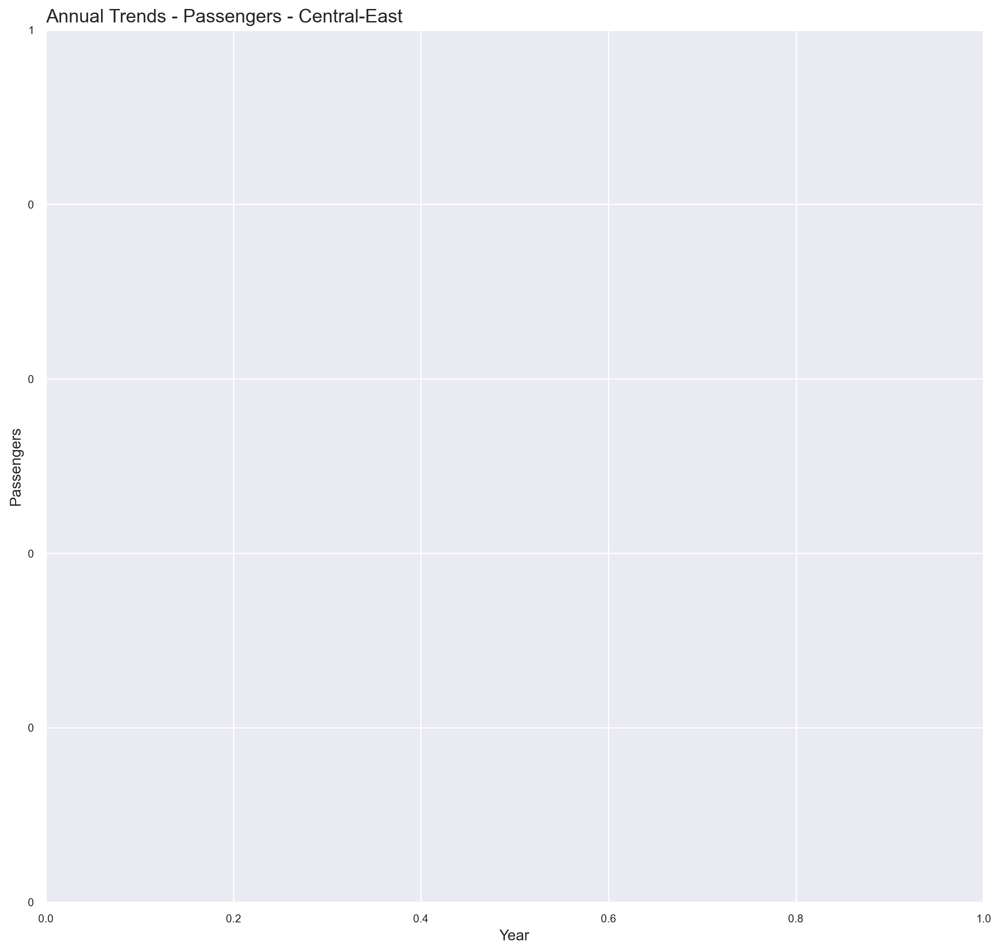

In [70]:
# plot the time series for Central-East annual passengers by airport 
fig, ax = plt.subplots(figsize = (12,12))
plt.title('Annual Trends - Passengers - Central-East', loc='left', fontsize = 15)
plt.xticks(rotation = 0)
plt.ticklabel_format(style='plain', axis='y')
plt.ylabel('Passengers', fontsize = 12)
plt.xlabel('Year', fontsize = 12)
ax.get_yaxis().set_major_formatter(tkr.FuncFormatter(lambda x, p: format(int(x), ',')))

sns.lineplot(data=df_AOI, x='Year', y='PAX - Ancona', marker='o', label='Ancona')
sns.lineplot(data=df_FRL, x='Year', y='PAX - Forlì', marker='o', label='Forlì')
sns.lineplot(data=df_PEG, x='Year', y='PAX - Perugia', marker='o', label='Perugia')
sns.lineplot(data=df_PSR, x='Year', y='PAX - Pescara', marker='o', label='Pescara')

plt.legend(loc="upper left")
plt.show()